In [2]:
import skysurvey
import numpy as np
import sncosmo
import pandas
from src import *
from tqdm.auto import tqdm
import jax.numpy as jnp
import pickle
from lemaitre import bandpasses
filterlib=bandpasses.get_filterlib()

/global/homes/a/agillesl/.conda/envs/lemaitre/lib/python3.9/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()
2024-11-19 03:45:15,531 INFO sparse_dot_mkl found. Building hessian should be faster.
2024-11-19 03:45:15,550 INFO loading lemaitre filterlib from /global/homes/a/agillesl/.cache/bbf/lemaitre_flib.default.0b8479e36fca60c99e76ea84d98cbe0c7383608814cddfaef21626fdf668b5c5.pkl
2024-11-19 03:45:16,222 INFO loading lemaitre filterlib from /global/homes/a/agillesl/.cache/bbf/lemaitre_flib.default.0b8479e36fca60c99e76ea84d98cbe0c7383608814cddfaef21626fdf668b5c5.pkl


In [2]:
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=14)    # fontsize of the tick labels
plt.rc('ytick', labelsize=14)    # fontsize of the tick labels
plt.rc('legend', fontsize=12)    # legend fontsize

# Nice plots

In [6]:
bgs_df = load_bgs(
    path="/global/cfs/cdirs/desi/cosmosim/FirstGenMocks/AbacusSummit/CutSky/BGS_v2/z0.200/cutsky_BGS_z0.200_AbacusSummit_base_c000_ph000.fits",
    filename='Abacus.csv',
    columns=[
        "RA",
        "DEC",
        "Z",
        "Z_COSMO",
        "STATUS",
    ]
)

2024-08-07 03:52:29,669 INFO Reading BGS data from fits file
2024-08-07 03:52:44,562 INFO Done


In [3]:
bgs_df = load_bgs(
    path="/global/cfs/cdirs/desi/cosmosim/FirstGenMocks/Uchuu/LightCone/BGS_v2/BGS_LC_Uchuu.fits",
    filename='Uchuu.csv',
    columns=[
        "RA",
        "DEC",
        "Z",
        "Z_COSMO",
        "STATUS",
    ]
)

In [151]:
hmap = np.zeros(healpy.nside2npix(128))
nb = np.zeros(healpy.nside2npix(128))
hpix = healpy.ang2pix(128, np.pi/2 - (bgs_df[::20]["dec"] * np.pi / 180),
                      (bgs_df[::20]["ra"] - 360 * (bgs_df[::20]["ra"] > 180)) * np.pi / 180)

for vp, pix in zip(bgs_df[::20]["z"] - bgs_df[::20]["z_cosmo"], hpix):
    hmap[pix] += 1
    nb[pix] += 1

# hmap[nb!=0] = hmap[nb!=0]/nb[nb!=0]

hmap = healpy.smoothing(hmap, fwhm=0.07)
mask = (hmap < 2)
hmap[mask] = None 

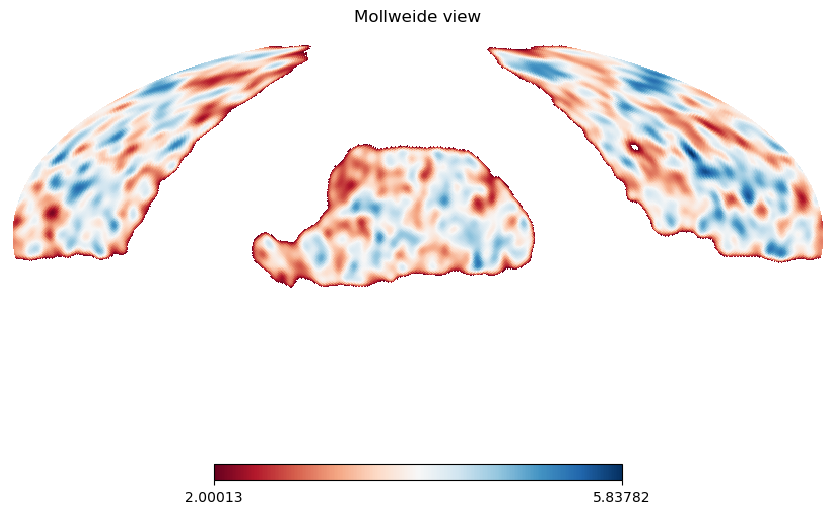

In [152]:
healpy.mollview(hmap,
    cmap="RdBu",
    badcolor='white',
    norm='symlog'
)

In [194]:
from astropy.units import hourangle, degree, arcmin, arcsec
def convertra(strhour: str):
    """
    Converts a string angle "hh:mm:ss" (hours minutes seconds) to an astropy angle in degree.
    Used to convert the ra column of SN datafile.

    Parameters
    ----------
    strhour : str
        Angle as a string

    Return
    ------
    angle : astropy.units.Quantity
        Angle in degree
    """
    h, m, s = float(strhour[0:2]), float(strhour[3:5]), float(strhour[6:])
    return ((h + m / 60 + s / 3600) * hourangle).to(degree)


def convertdec(strhour: str):
    """
    Converts a string angle "+dd:mm:ss" (sign degrees minutes seconds) to an astropy angle in degree.
    Used to convert the dec column of SN datafile.

    Parameters
    ----------
    strhour : str
        Angle as a string

    Return
    ------
    angle : astropy.units.Quantity
        Angle in degree
    """
    d, m, s = float(strhour[0:3]), float(strhour[4:6]), float(strhour[7:])
    return (d * degree + m * arcmin + s * arcsec).to(degree)


In [195]:
data = pandas.read_csv("data/ZTF_SNe_bts.csv").rename(columns=lambda s : s.lower())
data.ra = data.ra.apply(lambda x : convertra(x).value)
data.dec = data.dec.apply(lambda x : convertdec(x).value)

In [213]:
from dustmaps.planck import PlanckQuery
from astropy.coordinates import SkyCoord

In [224]:
nside=128
ra, dec = healpy.pix2ang(nside, np.arange(healpy.nside2npix(nside)), lonlat=True)

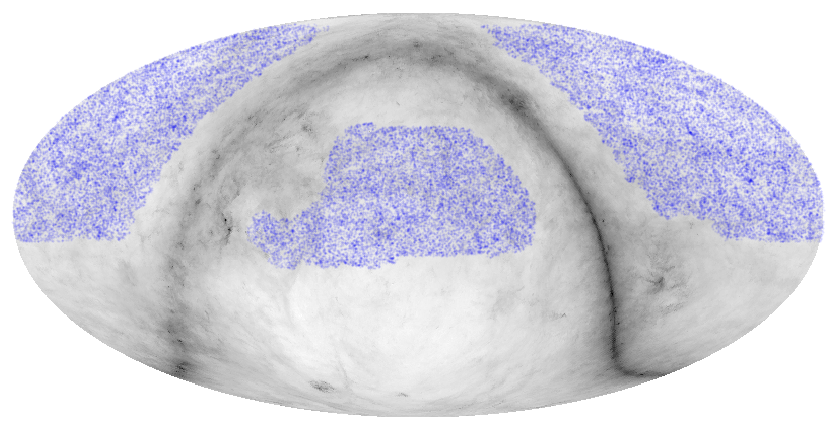

In [252]:
healpy.mollview(PlanckQuery()(SkyCoord(ra, dec, unit="deg")), norm="log", cmap="Greys", title=None, cbar=False)
healpy.projscatter(bgs_df[::100].ra, bgs_df[::100].dec, lonlat=True, color="blue", alpha=.1, marker=".", s=1., label="DESI")
# healpy.projscatter(data.ra, data.dec, lonlat=True, color="red", alpha=1, marker=".", s=1., label="ZTF SNe Ia")
plt.savefig("../figures/Rapports/desi_on_dust.png")

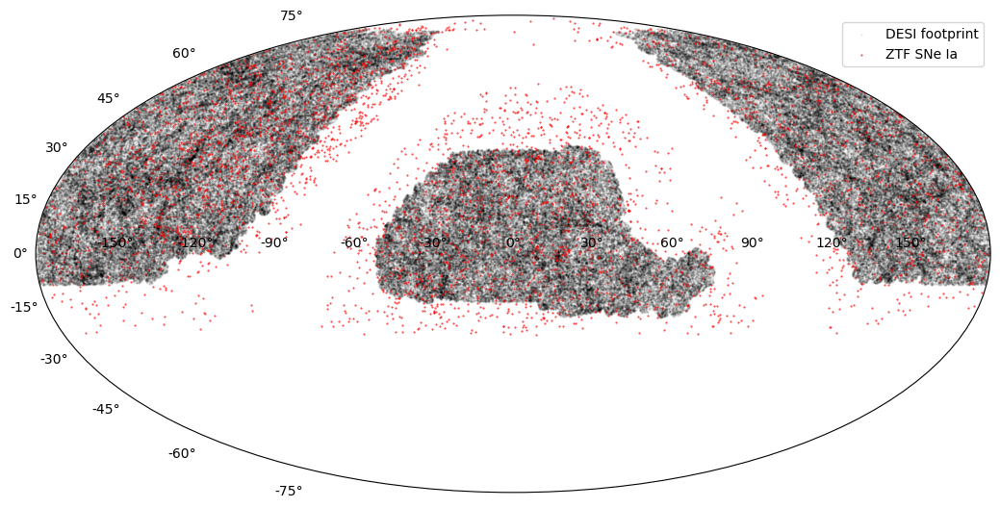

In [160]:
fig, ax = plt.subplots(subplot_kw=dict(projection="mollweide"), figsize=(12.8,9.6))
scatter_mollweide(bgs_df[::20], ax, alpha=0.1, label="Uchuu in DESI footprint")
scatter_mollweide(data, ax=ax, color="r", alpha=0.8, label="ZTF SNe Ia")
plt.legend(loc='upper right')

In [ ]:
healpy.vec2ang(healpy.pixelfunc.fit_dipole(hmap)[1], lonlat=True)
hmap_rm_dip = healpy.pixelfunc.remove_dipole(hmap)


In [ ]:
healpy.mollview((hmap - hmap_rm_dip) * 3 * 10**5,
    cmap="RdBu"
)

In [74]:
# bgs_df[bgs_df['z'] < 0.15].to_csv('./data/Abacus.csv')

In [35]:
%matplotlib inline

2024-07-04 05:05:31,170 WARNING Pandas support in corner is deprecated; use ArviZ directly


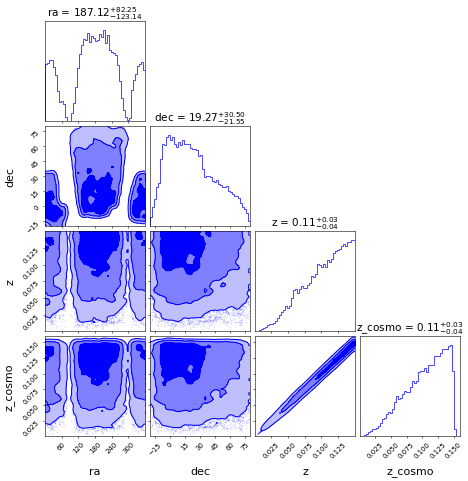

In [36]:
fig = corner_(
    bgs_df[::50], var_names=["ra", "dec", "z", "z_cosmo"]
)

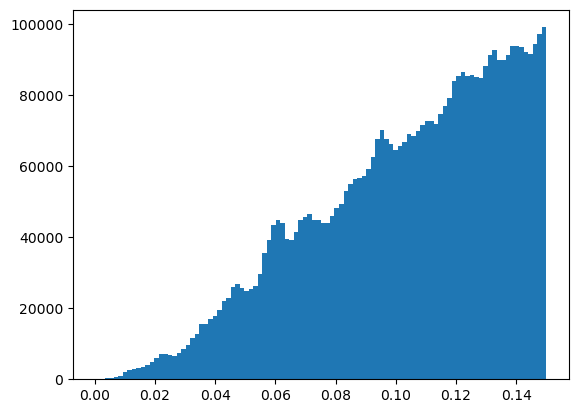

In [37]:
_ = plt.hist(bgs_df["z"], 100)

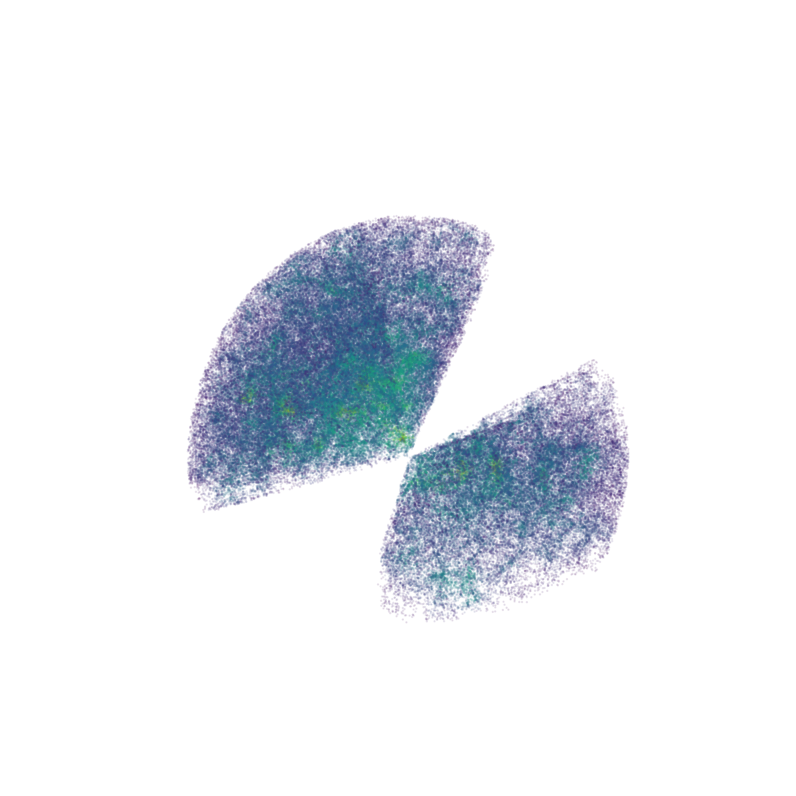

In [10]:
%matplotlib inline

from astropy.cosmology import Planck18 as cosmo
dist = cosmo.comoving_distance(bgs_df[::20]['z'])
x = np.cos(np.pi/180*bgs_df[::20]['ra'])*np.cos(np.pi/180*bgs_df[::20]['dec'])*dist
y = np.sin(np.pi/180*bgs_df[::20]['ra'])*np.cos(np.pi/180*bgs_df[::20]['dec'])*dist
z = np.sin(np.pi/180*bgs_df[::20]['dec'])*dist

scatter_3d(x,y,z)
plt.gca().axis('off')

plt.gcf().delaxes(plt.gcf().axes[1])

plt.tight_layout()
# plt.title('2% of Abacus galaxies')
plt.savefig('../figures/Rapports/Uchuu.png')

In [143]:
with open("outdir/SN_Uchuu.pkl", "rb") as f:
    data = pickle.load(f)
    lc = pickle.load(f)
    res_sn = pickle.load(f)
    meta = pickle.load(f)

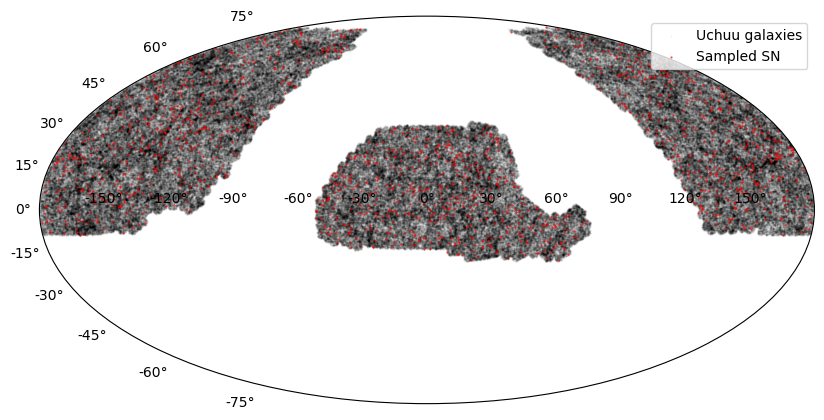

In [144]:
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw=dict(projection="mollweide"))
scatter_mollweide(bgs_df[::20], ax=ax, color="k", alpha=0.05, label="Uchuu galaxies")
scatter_mollweide(data, ax=ax, color="r", alpha=0.8, label="Sampled SN")
plt.legend(loc="upper right")
plt.savefig("../figures/SN_ra_dec_sampling.png")

In [145]:
ztf_sn = pandas.read_csv("data/data_ztf.csv", index_col=0)

Text(0.5, 1.0, 'Distortion in redshift space')

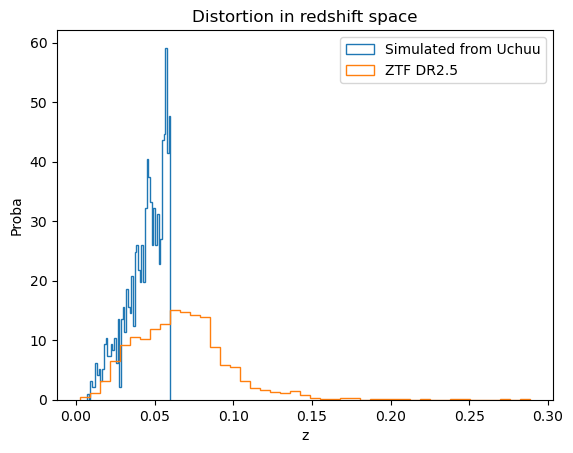

In [146]:
%matplotlib inline
dset.targets.data[dset.targets.data.valid]['z'].plot.hist(bins=49, histtype='step', density=True, label='Simulated from Uchuu')
ztf_sn['z'].plot.hist(bins=45, histtype='step', label='ZTF DR2.5',  density=True)
plt.legend()
plt.xlabel('z')
plt.ylabel('Proba')
plt.title('Distortion in redshift space')

In [ ]:
snia.data['redshift'].plot.hist(bins=49, histtype='step', density=True, label='Homogeneous Universe')
snia.data['z'].plot.hist(bins=49, histtype='step', density=True, label='Homogeneous Universe')


In [ ]:
_=corner_(dset.targets.data()

In [ ]:
from skysurvey import DataSet

dset = DataSet(lc)
dset.set_survey(extract_ztf())
dset.set_targets(SNeIa_full_bgs.from_data(data))

good : 18
bad : 57, 61, 

In [ ]:
data[~data["good"]]

In [ ]:
dset_sanitize_and_filter(dset)

In [ ]:
plot_lc(dset, dset.targets.data[dset.targets.data["keep"]].index[i])
i += 1

# Generation

In [113]:
with open("outdir/SN_Uchuu.pkl", "rb") as f:
    data_ztf = pickle.load(f)
    lc_ztf = pickle.load(f)
    res_sn_ztf = pickle.load(f)
    meta_ztf = pickle.load(f)

In [12]:
snia = SNeIa_full_bgs()

snia.draw(size=50000, inplace=True)

,redshift,x1,c,t0,ra,dec,z,bgs_id,z_cosmo,magabs,mwebv,magobs,x0,template
0,0.01455,-0.650,-0.031,58868.296875,268.370300,18.895515,0.021557,18988206.0,0.021054,-19.271669,0.105288,15.609445,0.009113,None
1,0.04755,1.505,-0.112,58968.738281,149.238922,18.686510,0.056349,66724372.0,0.055214,-19.894482,0.035734,17.134094,0.002238,None
2,0.04985,0.810,-0.054,58298.195312,139.297791,14.955792,0.046602,4269926.0,0.043972,-19.493790,0.039085,17.022974,0.002479,None
3,0.05465,1.370,-0.109,58829.257812,225.073105,32.553524,0.041519,44004736.0,0.039849,-19.955242,0.023965,16.341278,0.004644,None
4,0.03155,0.330,0.409,58943.894531,139.016617,-2.153382,0.057046,44193004.0,0.055312,-17.970854,0.037785,19.061708,0.000379,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.04585,-1.705,-0.083,58941.996094,194.257843,44.347157,0.022078,58976900.0,0.021165,-19.443562,0.023929,15.449125,0.010563,None
49996,0.03835,0.145,0.234,58384.132812,21.129227,-12.270080,0.045035,29069996.0,0.043143,-18.548698,0.023273,17.925428,0.001080,None
49997,0.05375,-2.410,-0.068,58337.695312,125.156662,16.200094,0.031367,7435169.0,0.030640,-19.087584,0.037494,16.623735,0.003580,None
49998,0.04345,-2.325,-0.037,58847.179688,138.279648,9.670552,0.050629,59181824.0,0.050217,-19.144123,0.082857,17.670727,0.001365,None


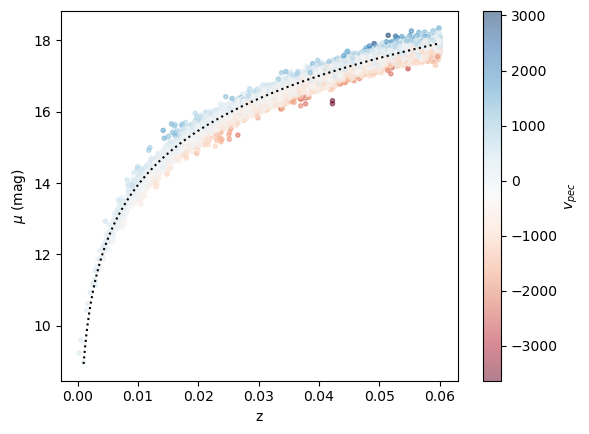

In [60]:
cb = plt.scatter(snia.data["z"], snia.data["magobs"] + 0.14*snia.data["x1"] - 3.15*snia.data["c"],
            c=(snia.data["z_cosmo"] - snia.data["z"])*c*1e-3, cmap='RdBu', marker=".", alpha=0.5)

plt.plot(np.linspace(1e-3, 0.06, 10000), mag_Planck15(np.linspace(1e-3, 0.06, 10000)), "k:", label='Vraie cosmologie')
plt.colorbar(label='$v_{pec}$')
plt.xlabel("z")
plt.ylabel("$\mu$ (mag)")
plt.savefig("../figures/Rapports/vp.png")

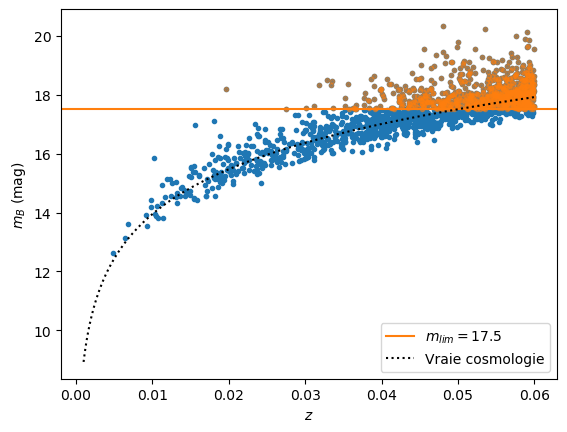

In [658]:
plt.scatter(data_ztf["z"], data_ztf["magobs"] , marker=".")
plt.scatter(data_ztf[data_ztf["magobs"] > 17.5]["z"], data_ztf[data_ztf["magobs"] > 17.5]["magobs"], marker=".", alpha=.5)
plt.axhline(17.5, color='tab:orange', label='$m_{lim} = 17.5$')
plt.plot(np.linspace(1e-3, 0.06, 10000), mag_Planck15(np.linspace(1e-3, 0.06, 10000)), "k:", label='Vraie cosmologie')
plt.xlabel("$z$")
plt.ylabel("$m_B$ (mag)")
plt.legend(loc='lower right')
# plt.savefig("../figures/Malmquist.png")

In [110]:
snia = skysurvey.SNeIa()
snia.draw(size=1591, inplace=True)

,z,x1,c,t0,ra,dec,magabs,magobs,x0,template
0,0.18235,0.005,0.087,56183.402344,140.778595,-42.665733,-19.093624,20.709944,0.000083,salt2
1,0.15115,0.765,0.008,56125.570312,143.359024,-18.654163,-19.256437,20.098789,0.000145,salt2
2,0.07305,0.780,-0.016,56182.937500,106.142418,31.309975,-19.480360,18.185446,0.000844,salt2
3,0.15925,0.020,-0.059,56046.074219,291.693756,-13.074389,-19.550951,19.928408,0.000170,salt2
4,0.19625,0.555,0.134,56021.117188,109.790337,-12.237164,-18.928711,21.052017,0.000060,salt2
...,...,...,...,...,...,...,...,...,...,...
1586,0.16785,-0.105,0.063,56027.703125,300.650360,48.408012,-19.103592,20.501286,0.000100,salt2
1587,0.16255,-0.195,0.009,56190.414062,220.676285,14.059563,-19.241457,20.286795,0.000122,salt2
1588,0.11085,-0.295,0.100,56196.703125,224.028641,55.980438,-18.859797,19.766590,0.000197,salt2
1589,0.18455,0.630,-0.083,56083.773438,299.860138,-5.239661,-19.768198,20.064226,0.000150,salt2


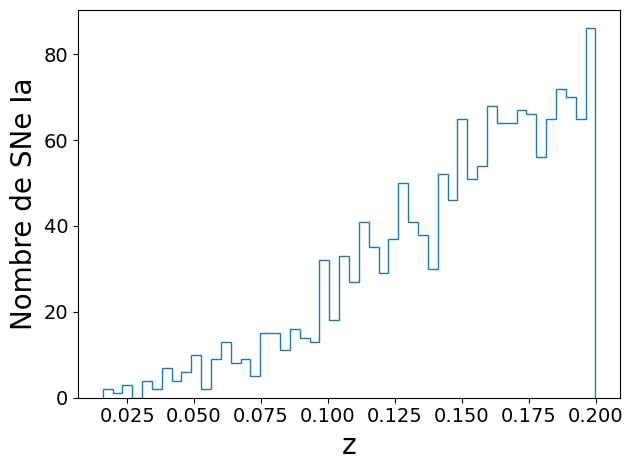

In [117]:
_, bins, _= plt.hist(snia.data["z"], bins=50, histtype='step')
plt.xlabel("z")
plt.ylabel("Nombre de SNe Ia")
plt.tight_layout()
plt.savefig('../figures/Rapports/unif_redshift_draw.png')

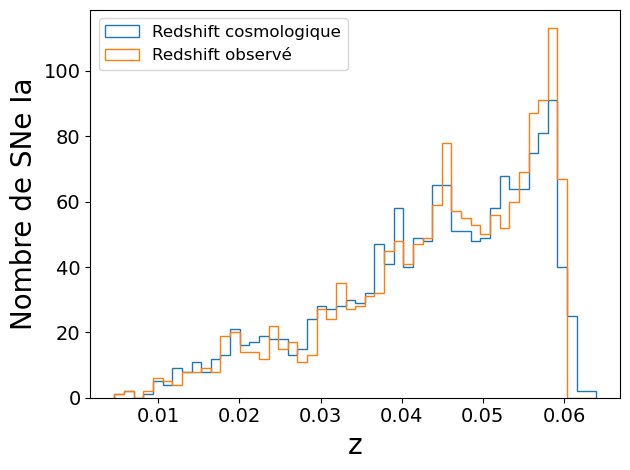

In [118]:
_, bins, _= plt.hist(data_ztf["z_cosmo"], bins=50, histtype='step', label='Redshift cosmologique')
plt.hist(data_ztf["z"], bins=bins, histtype='step', label='Redshift observé')
plt.legend()
plt.xlabel("z")
plt.ylabel("Nombre de SNe Ia")
plt.tight_layout()
plt.savefig('../figures/Rapports/redshift_draw.png')

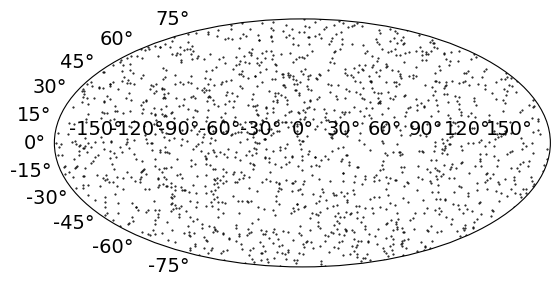

In [119]:
scatter_mollweide(snia.data, alpha=1.)
plt.savefig('../figures/Rapports/unif_angular_draw.png')

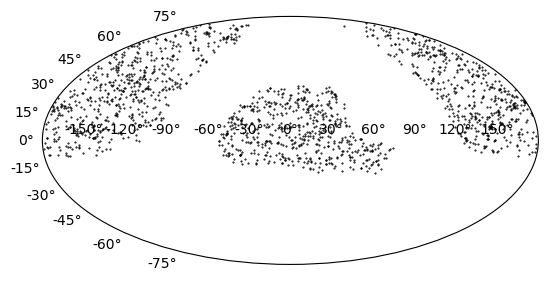

In [660]:
scatter_mollweide(data_ztf, alpha=1.)
plt.savefig('../figures/Rapports/angular_draw.png')

In [48]:
dset = skysurvey.DataSet(lc_ztf)
dset.set_survey(extract_ztf())
dset.set_targets(SNeIa_full_bgs.from_data(data_ztf))

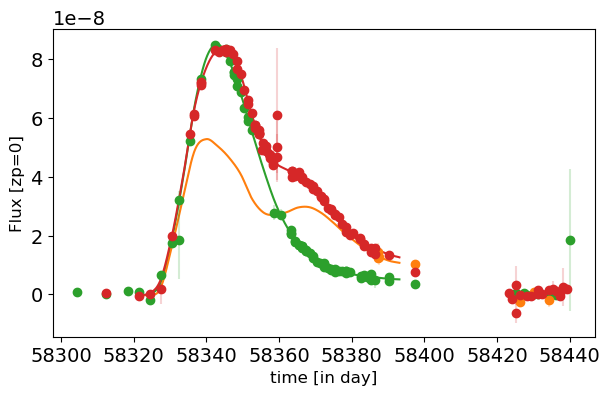

In [53]:
fig = dset.show_target_lightcurve(index=26, phase_window=[-40, 100], show_truth=True, format_time=False)
plt.savefig("../figures/Rapports/26_lc.png")

In [454]:
dset.targets.data.loc[26]

redshift             0.02925
x1                    -0.385
c                      0.006
t0              58343.132812
ra                 29.327135
dec                22.312893
z                   0.044472
bgs_id            26050614.0
z_cosmo              0.04481
magabs            -19.209524
mwebv               0.094254
magobs             17.349445
x0                  0.001835
template                None
keep                    True
valid                   True
converged               True
used_edris              True
calc_z_cosmo        0.044563
Name: 26, dtype: object

In [26]:
spectra = pandas.read_csv("data/Mock_Uchuu_sp.csv")

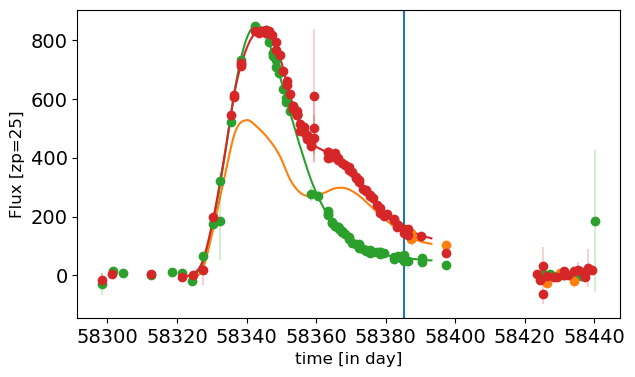

In [54]:
dset.show_target_lightcurve(index=26, phase_window=[-50,100], format_time=False)
plt.gca().axvline(np.unique(spectra[spectra.sn==26].time))
plt.savefig("../figures/Rapports/26_lc_pt.png")

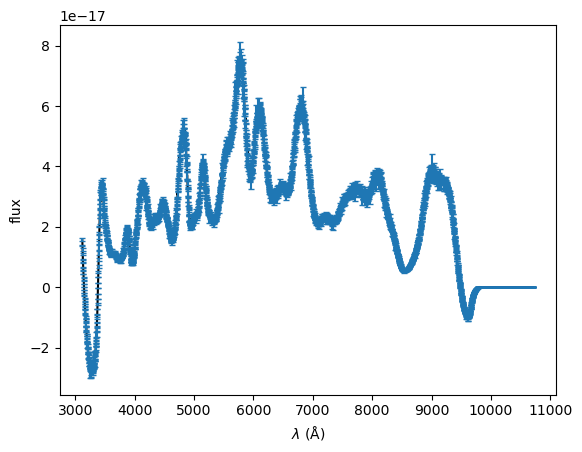

In [87]:
plt.figure()
spec = spectra[spectra.sn==26]
plt.plot(spec.wavelength, spec.flux, color="k")
plt.errorbar(spec.wavelength, spec.flux, spec.fluxerr, capsize=2, linestyle='', color='tab:blue')
plt.ylabel("flux")
plt.xlabel("$\lambda$ (Å)")
plt.savefig('../figures/Rapports/26_spec.png')

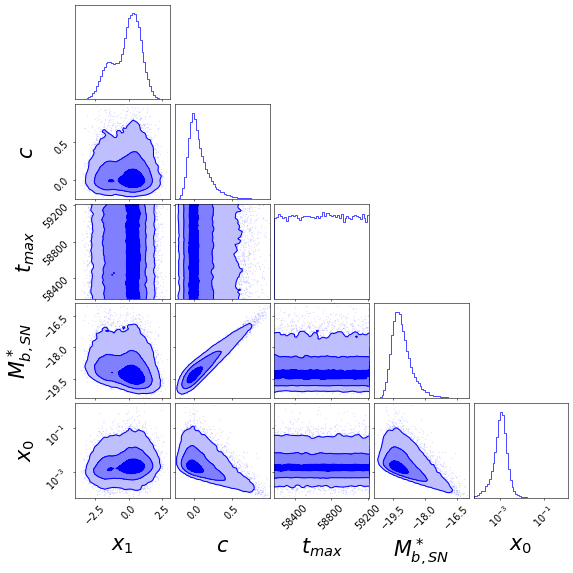

In [25]:
fig = corner_(snia.data, var_names=["x1", "c", "t0", "magabs", "x0"], labels=["$x_1$", "$c$", "$t_{max}$", "$M^*_{b, SN}$", "$x_0$"],
             axes_scale=['linear', 'linear', 'linear', 'linear', 'log'],
             show_titles=False,
             label_kwargs=dict(fontsize=30),
             labelpad=0.1,
             max_n_ticks=3,
             )
# corner.overplot_lines(fig, np.array(dset.targets.data.loc[26, ["x1", "c", "t0", "magabs", "x0"]]), color="cyan")
# corner.overplot_points(fig, np.array(dset.targets.data.loc[26, ["x1", "c", "t0", "magabs", "x0"]]).reshape(1, -1), marker="s", color="cyan")
fig.subplots_adjust(bottom=0.13, left=0.13)

plt.savefig('../figures/Rapports/SNe_sampling.png')

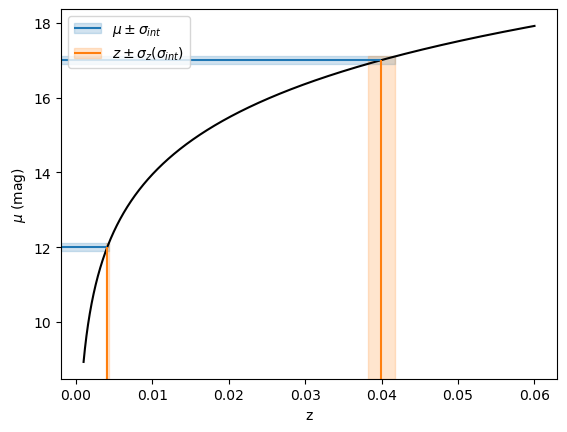

In [34]:
plt.plot(np.linspace(1e-3, 0.06, 10000), mag_Planck15(np.linspace(1e-3, 0.06, 10000)), "k")
def add_(mag, label=False):
    xlims = plt.gca().get_xlim()
    line1 = plt.hlines(mag, xlims[0], mag_to_z([mag])[0], color='tab:blue')
    fill1 = plt.fill_between([xlims[0], mag_to_z([mag+.1])[0]], [mag-.1, mag-.1], [mag+.1, mag+.1], alpha=0.2,
                     color='tab:blue')
    plt.xlim(xlims)
    ylims = plt.gca().get_ylim()
    line2 = plt.vlines(mag_to_z([mag]), ylims[0], mag, color='tab:orange')
    fill2 = plt.fill_between(mag_to_z([mag-.1, mag+.1]), [ylims[0]] * 2, [mag+.1] * 2, alpha=0.2,
                     color='tab:orange')
    plt.ylim(ylims)
    if label:
        plt.legend([(fill1, line1), (fill2, line2)], ['$\mu \pm \sigma_{int}$', '$z \pm \sigma_{z}(\sigma_{int})$'])
add_(12, label=True)
add_(17)
plt.xlabel("z")
plt.ylabel(r"$\mu$ (mag)")

plt.savefig("../figures/Rapports/sigma_int_effect_vp.png")

# PETS

In [507]:
def Tmax_chi2(name,lc_ztf,data_ztf,x1_lim=4,c_lim=1,showfig=False,savefig=False,output_fig=None):
    from lemaitre import bandpasses
    filterlib = bandpasses.get_filterlib()

    import warnings
    from iminuit.warnings import IMinuitWarning

    warnings.filterwarnings("ignore", category=IMinuitWarning)

    df_Tmax_1SN=dict(name=name)
    
    #Select data for specific SN
    lc_sn=lc_ztf[lc_ztf.name==name]
    #Remove i band for fitting
    #lc_sn=lc_sn[lc_sn['band']!='ztf::I'] 
    #Redshift and MW extinction
    mwebv=data_ztf[data_ztf.name==name].mwebv.values[0]
    zsn=data_ztf[data_ztf.name==name].zhel.values[0]
    df_Tmax_1SN['mebv']=mwebv
    df_Tmax_1SN['zhel']=zsn
    
    #Transform to Table for sncosmo
    lc_sncosmo=Table.from_pandas(lc_sn[['mjd','band','flux','fluxerr','zp','magsys','valid']])
    lc_sncosmo=lc_sncosmo[lc_sncosmo['valid']==1]
    # create a model
    source = sncosmo.SALT2Source(modeldir=modelpath,m0file=m0file, m1file=m1file, clfile=clfile)
    dust = sncosmo.CCM89Dust()
    model = sncosmo.Model(source=source,effects=[dust],effect_names=['mw'],effect_frames=['obs'])

    model.set(z=zsn,mwebv=mwebv,mwr_v=3.1)  # set the model's redshift and MW

    #First fit to get a starting position for MCMC

    if np.size(lc_sncosmo)>0:
        try:

            res, mod = sncosmo.fit_lc(lc_sncosmo, model,['t0', 'x0', 'x1', 'c'],bounds={'x0':(-0.1,10),'x1':(-5, 5),'c':(-3, 3)},phase_range=None,modelcov=False)
            sncosmo.plot_lc(lc_sncosmo, model=mod, errors=res.errors)
            if savefig:

                plt.savefig(output_fig+'%s_sncosmo.png'%name)

            if showfig:
                plt.show()
                plt.close()
            plt.close()
            df_Tmax_1SN['Tsncosmo']=res.parameters[1]
            df_Tmax_1SN['eTsncosmo']=res.errors['t0']
            df_Tmax_1SN['x2sncosmo']=res.chisq
        except:
            pass
        finally:
            if os.path.isfile('pets/Tgrid/%s.dat' %name):
                grid=np.loadtxt('pets/Tgrid/%s.dat' %name).transpose()
                if (np.size(grid)>10):

                    Tmax,x0_grid,ex0_grid,x1_grid,ex1_grid,c_grid,ec_grid,chi2_grid=grid[0],grid[1],grid[2],grid[3],grid[4],grid[5],grid[6],grid[-2]
                    func_chi2=np.vectorize(interp1d(Tmax,chi2_grid))

                    #Look for all the minimum
                    min_local=np.unique(argrelmin(chi2_grid)[0])
                    Tmin_tot,chi2min_tot,x0_tot,ex0_tot,x1_tot,ex1_tot,c_tot,ec_tot=Tmax[min_local],chi2_grid[min_local],x0_grid[min_local],ex0_grid[min_local],x1_grid[min_local],ex1_grid[min_local],c_grid[min_local],ec_grid[min_local]

                    #Remove minimum where X1 and c out limit
                    good_mins = (np.abs(x1_grid[min_local])<x1_lim) & (np.abs(c_grid[min_local])<c_lim)
                    Tmin_all=Tmin_tot[good_mins]
                    chi2min_all=chi2min_tot[good_mins]
                    x0_all=x0_tot[good_mins]
                    ex0_all=ex0_tot[good_mins]
                    x1_all=x1_tot[good_mins]
                    ex1_all=ex1_tot[good_mins]
                    c_all=c_tot[good_mins]
                    ec_all=ec_tot[good_mins]

                    df_Tmax_1SN['n_min']=np.size(Tmin_all)
                    if np.size(Tmin_all)>0:
                        ind_Tmin=np.where(chi2min_all==min(chi2min_all))[0][0]

                        df_Tmax_1SN['Tchi2']=Tmin_all[ind_Tmin]
                        df_Tmax_1SN['X2min']=chi2min_all[ind_Tmin]
                        df_Tmax_1SN['x1_chi2']=x1_all[ind_Tmin]
                        df_Tmax_1SN['x0_chi2']=x0_all[ind_Tmin]
                        df_Tmax_1SN['c_chi2']=c_all[ind_Tmin]
                        df_Tmax_1SN['ex1_chi2']=ex1_all[ind_Tmin]
                        df_Tmax_1SN['ec_chi2']=ec_all[ind_Tmin]
                        df_Tmax_1SN['ex0_chi2']=ex0_all[ind_Tmin]
                        #Confidence 	   68.27%	   95.45%	   99.73%	   99.99%	  100.00%
                        #p-value    	 0.31731	 0.04550	 0.00270	 0.00006	 0.00000
                        #sigma(k=1) 	    1.00	    2.00	    3.00	    4.00	    5.00
                        #chi2(d=1) 	    1.00	    4.00	    9.00	   16.00	   25.00

                        df_Tmax_1SN['n_min_8sig']=np.size(chi2min_all[chi2min_all<df_Tmax_1SN['X2min']+64])
                        #Calcul error max and min for each mininim
                        err_Tmax=interpolated_intercepts(Tmax,func_chi2(Tmax),df_Tmax_1SN['X2min']+1)

                        #Calcul 3 sig error max and min for each mininim
                        err_Tmax3sig=interpolated_intercepts(Tmax,func_chi2(Tmax),df_Tmax_1SN['X2min']+9)

                        try:
                            max_fig=min(np.array(err_Tmax)[err_Tmax>df_Tmax_1SN['Tchi2']])
                            min_fig=max(np.array(err_Tmax)[err_Tmax<df_Tmax_1SN['Tchi2']])
                            df_Tmax_1SN['eTchi2']=(np.sqrt((max_fig-df_Tmax_1SN['Tchi2'])**2+(df_Tmax_1SN['Tchi2']-min_fig)**2)/np.sqrt(2))
                            df_Tmax_1SN['eTchi2_min']=df_Tmax_1SN['Tchi2']-min_fig
                            df_Tmax_1SN['eTchi2_max']=max_fig-df_Tmax_1SN['Tchi2']
                            max_fig3sig=min(np.array(err_Tmax3sig)[err_Tmax3sig>df_Tmax_1SN['Tchi2']])
                            min_fig3sig=max(np.array(err_Tmax3sig)[err_Tmax3sig<df_Tmax_1SN['Tchi2']])
                            df_Tmax_1SN['eTchi2_3sig']=(np.sqrt((max_fig3sig-df_Tmax_1SN['Tchi2'])**2+(df_Tmax_1SN['Tchi2']-min_fig3sig)**2)/np.sqrt(2))
                            df_Tmax_1SN['eTchi2_3sig_min']=df_Tmax_1SN['Tchi2']-min_fig3sig
                            df_Tmax_1SN['eTchi2_3sig_max']=max_fig3sig-df_Tmax_1SN['Tchi2']
                            #Refit using Tchi2
                            model.set(z=zsn,mwebv=mwebv,mwr_v=3.1,t0=df_Tmax_1SN['Tchi2'])  # set the model's redshift and MW
                            #First fit to get a starting position for MCMC

                            res_fit, mod_fit = sncosmo.fit_lc(lc_sncosmo, model,['t0', 'x0', 'x1', 'c'],phase_range=None,modelcov=False,guess_t0=False)
                            df_Tmax_1SN['x2sncosmo_fit']=res_fit.chisq
                            df_Tmax_1SN['Tsncosmo_fit'],df_Tmax_1SN['x0_sncosmo'],df_Tmax_1SN['x1_sncosmo'],df_Tmax_1SN['c_sncosmo']=res_fit.parameters[1:5]
                            df_Tmax_1SN['eTsncosmo_fit'],df_Tmax_1SN['ex0_sncosmo'],df_Tmax_1SN['ex1_sncosmo'],df_Tmax_1SN['ec_sncosmo']=res_fit.errors['t0'],res_fit.errors['x0'],res_fit.errors['x1'],res_fit.errors['c']
                            if showfig:

                                #Figures
                                fig, ax1 = plt.subplots(figsize=(8,6), facecolor='w', edgecolor='k')
                                ax1.plot(Tmax,chi2_grid,color='black',marker='s',alpha=0.6,ms=3,linestyle=None)


                                ax1.set_ylabel('$\chi^2$')
                                ax1.set_xlabel('$t_{max}$')


                                ax1.axhline(y=df_Tmax_1SN['X2min'],color='black')
                                ax1.axhline(y=df_Tmax_1SN['X2min']+9,color='grey')
                                ax1.axvline(x=df_Tmax_1SN['Tsncosmo'],color='r',label='SN cosmo:%0.1f+/-%0.3f'%(df_Tmax_1SN['Tsncosmo'],df_Tmax_1SN['eTsncosmo']))
                                if 'Tchi2' in df_Tmax_1SN.keys():
                                    ax1.axvline(x=df_Tmax_1SN['Tchi2'],color='b',alpha=0.6)
                                    ax1.axvspan(min_fig, max_fig, alpha=0.3, color='blue',label='%0.1f+%0.3f-%0.3f'%(df_Tmax_1SN['Tchi2'],df_Tmax_1SN['eTchi2_max'],df_Tmax_1SN['eTchi2_min']),zorder=2)
                                    ax1.axvspan(min_fig3sig, max_fig3sig, alpha=0.1, color='blue',zorder=2)
                                #ax1.set_xlim([Tmin-20, Tmin+20])
                                #ax1.set_ylim([chi2min*0.95, chi2min*1.8])


                                ax1.tick_params(axis='both', which='major', direction='in',right='on',top='on')

                                ax1.plot(Tmax[(np.abs(x1_grid)<x1_lim) & (np.abs(c_grid)<c_lim)],
                                         chi2_grid[(np.abs(x1_grid)<x1_lim) & (np.abs(c_grid)<c_lim)],
                                         color='b',marker='s',alpha=0.6,ms=3,linestyle=None,label='|x1|<%s;|c|<%s'%(x1_lim,c_lim))


                                ax1.legend(loc=0,markerscale=1.0,ncol=1) 


                                if savefig:
                                    plt.savefig(output_fig+'%s_Tmaxgrid.png'%name,bbox_inches='tight')
                                plt.show()
                                plt.close()
                        except:
                            key_suppr = set(df_Tmax_1SN.keys()) - {'name', 'Tsncosmo', 'eTsncosmo', 'zhel', 'mebv'}
                            for key in key_suppr:
                                del df_Tmax_1SN[key]

    return df_Tmax_1SN
def interpolated_intercepts(x, y1, y):
    """Find the intercepts of two curves, given by the same x data"""
    y2=np.zeros(np.size(x))+y
    def intercept(point1, point2, point3, point4):
        """find the intersection between two lines
        the first line is defined by the line between point1 and point2
        the first line is defined by the line between point3 and point4
        each point is an (x,y) tuple.

        So, for example, you can find the intersection between
        intercept((0,0), (1,1), (0,1), (1,0)) = (0.5, 0.5)

        Returns: the intercept, in (x,y) format
        """    

        def line(p1, p2):
            A = (p1[1] - p2[1])
            B = (p2[0] - p1[0])
            C = (p1[0]*p2[1] - p2[0]*p1[1])
            return A, B, -C

        def intersection(L1, L2):
            D  = L1[0] * L2[1] - L1[1] * L2[0]
            Dx = L1[2] * L2[1] - L1[1] * L2[2]

            x = Dx / D
            return x

        L1 = line([point1[0],point1[1]], [point2[0],point2[1]])
        L2 = line([point3[0],point3[1]], [point4[0],point4[1]])

        R = intersection(L1, L2)

        return R

    idxs = np.argwhere(np.diff(np.sign(y1 - y2)) != 0)

    xcs=[intercept((x[idx], y1[idx]),((x[idx+1], y1[idx+1])), ((x[idx], y2[idx])), ((x[idx+1], y2[idx+1])))[0] for i,idx in enumerate(idxs)]
    return np.array(xcs)



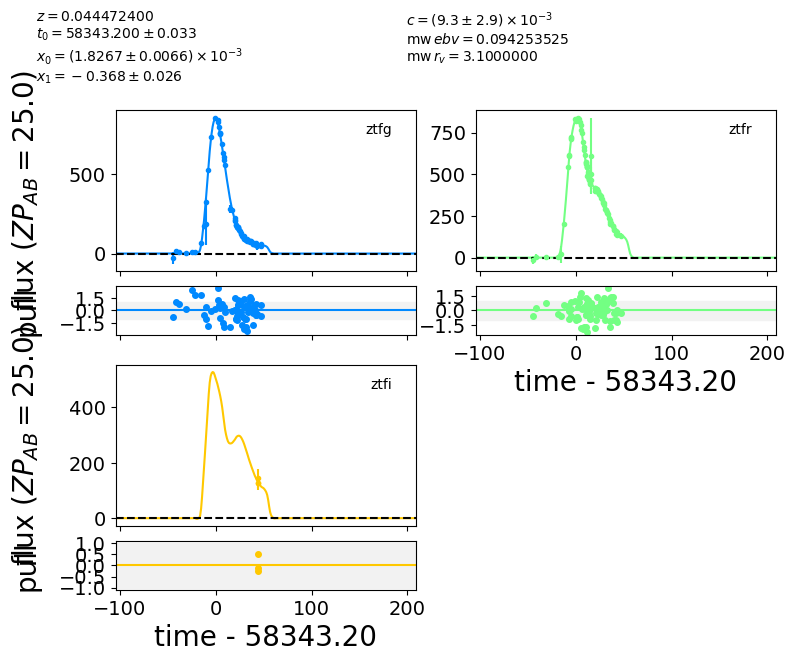

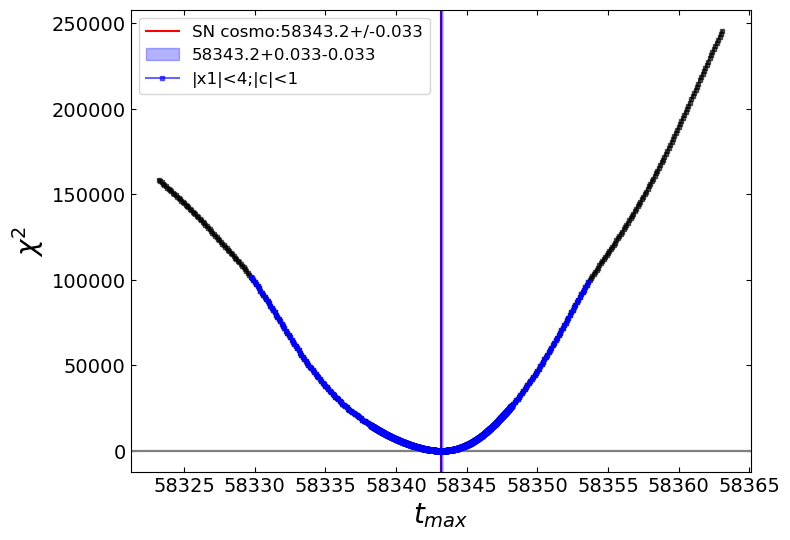

{'name': 26,
 'mebv': 0.094253525,
 'zhel': 0.0444724,
 'Tsncosmo': 58343.20005722432,
 'eTsncosmo': 0.0329139981076878,
 'x2sncosmo': 159.71688862084042,
 'n_min': 1,
 'Tchi2': 58343.20005722534,
 'X2min': 159.71688896232934,
 'x1_chi2': -0.3679491907079334,
 'x0_chi2': 0.0018266649800826094,
 'c_chi2': 0.009256539005258819,
 'ex1_chi2': 0.025500720494726764,
 'ec_chi2': 0.002898320812308805,
 'ex0_chi2': 6.370630553474894e-06,
 'n_min_8sig': 1,
 'eTchi2': 0.032615207251342135,
 'eTchi2_min': 0.03267969243461266,
 'eTchi2_max': 0.03255059431830887,
 'eTchi2_3sig': 0.09868361465835446,
 'eTchi2_3sig_min': 0.09925196248514112,
 'eTchi2_3sig_max': 0.09811197453382192,
 'x2sncosmo_fit': 159.71688869198852,
 'Tsncosmo_fit': 58343.20005591821,
 'x0_sncosmo': 0.0018266647291870048,
 'x1_sncosmo': -0.367925254259197,
 'c_sncosmo': 0.009256331357427757,
 'eTsncosmo_fit': 0.03290915886464063,
 'ex0_sncosmo': 6.597938631381591e-06,
 'ex1_sncosmo': 0.02633924705077162,
 'ec_sncosmo': 0.0029123883

In [508]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import sncosmo
from astropy.table import Table
from lemaitre import bandpasses
from joblib import Parallel, delayed
from scipy.interpolate import interp1d
from scipy.signal import argrelmin

from lemaitre import bandpasses
filterlib = bandpasses.get_filterlib()

import warnings
from iminuit.warnings import IMinuitWarning

warnings.filterwarnings("ignore", category=IMinuitWarning)

from tqdm.auto import tqdm

m0file='nacl_m0_test.dat'
m1file='nacl_m1_test.dat'
clfile='nacl_color_law_test.dat'
modelpath='data/SALT_snf/'
data_ztf=pandas.read_csv('pets/mock_sne.csv')
lc_ztf=pandas.read_csv('pets/mock_lc.csv')

Tmax_chi2(26,lc_ztf,data_ztf,x1_lim=4,c_lim=1,showfig=True,savefig=True, output_fig="../figures/Rapports/")

In [214]:
with open("outdir/SN_Uchuu.pkl", 'rb') as f:
    data = pickle.load(f)
    lc = pickle.load(f)

In [215]:
dset = skysurvey.DataSet(lc)
dset.set_targets(SNeIa_full_bgs.from_data(data))
dset.set_survey(extract_ztf())

In [216]:
dset_ztf = skysurvey.DataSet(pandas.read_csv('data/pets_uchuu/Results/mock_lc.csv').rename(columns={"mjd":"time"}))
dset_ztf.set_targets(SNeIa_full_bgs.from_data(pandas.read_csv('data/pets_uchuu/Results/mock_sne.csv').rename(columns={"tmax":"t0"})))
dset_ztf.data.set_index([dset_ztf.data.sn, dset_ztf.data.index], inplace=True)
dset_ztf.set_survey(extract_ztf())

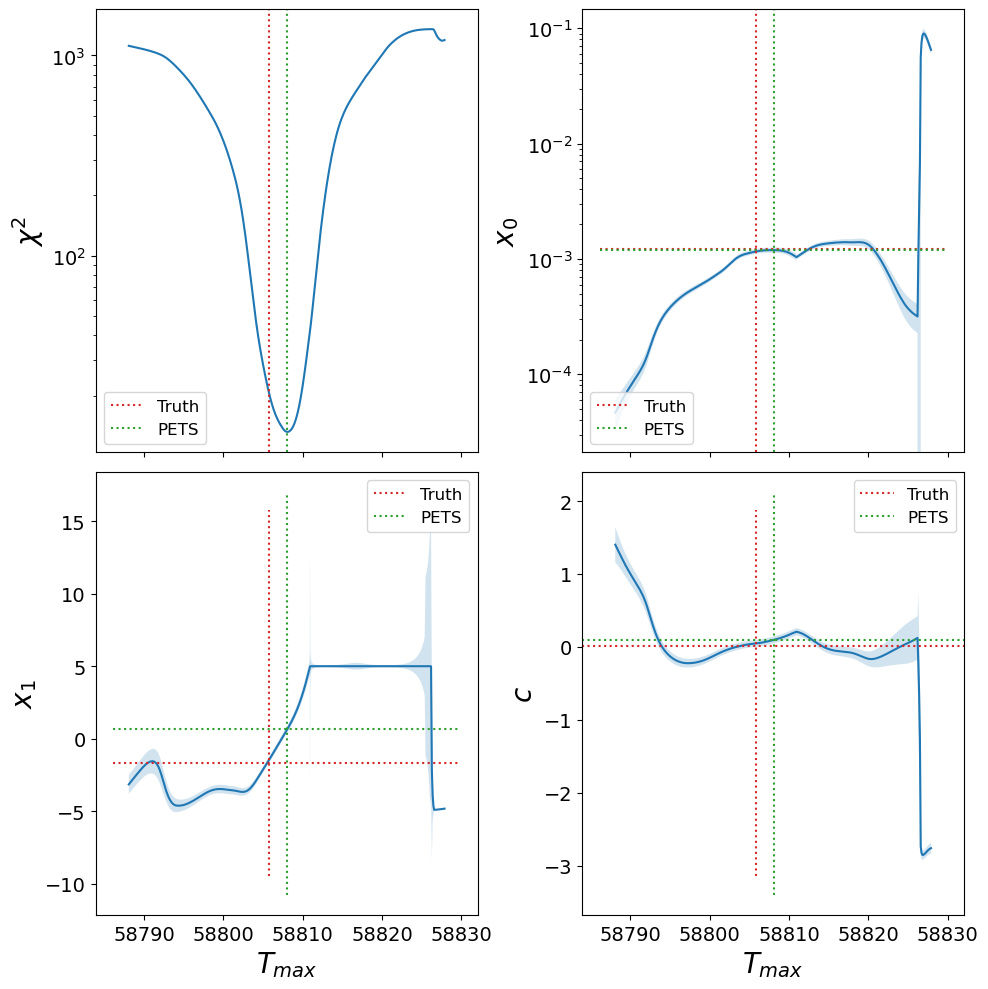

In [218]:
i=10
grid=np.loadtxt('data/pets_uchuu/Tgrid/%s.dat' %i).transpose()
if (np.size(grid)>10):
    Tmax,x0_grid,ex0_grid,x1_grid,ex1_grid,c_grid,ec_grid,chi2_grid=grid[0],grid[1],grid[2],grid[3],grid[4],grid[5],grid[6],grid[-2]
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10,10), sharex="col")
    t_range =(0,-1)
    pets_data = dset_ztf.targets.data.loc[i]
    true_data = dset.targets.data.loc[i]
    axs[0,0].plot(Tmax[t_range[0]:t_range[1]], chi2_grid[t_range[0]:t_range[1]])
    axs[0,0].axvline(true_data['t0'], color="tab:red", linestyle=':', label='Truth')
    axs[0,0].axvline(pets_data['t0'], color="tab:green", linestyle=':', label='PETS')
    axs[0,0].axhline(pets_data['X2min']+64, linestyle='--', color='k')
    axs[0,0].legend()
    axs[0,0].set_yscale("log")
    axs[0,0].set_ylabel(r"$\chi^2$")
    ylim = axs[0,0].get_ylim()
    fill2 = axs[0,0].fill_between([pets_data['t0'] - pets_data["err_tmax"], pets_data['t0'] + pets_data["err_tmax"]],
                                  *ylim, alpha=0.2, color='tab:green')
    axs[0,0].set_ylim(ylim)

    axs[0,1].fill_between(Tmax[t_range[0]:t_range[1]],
                          x0_grid[t_range[0]:t_range[1]] - ex0_grid[t_range[0]:t_range[1]],
                          x0_grid[t_range[0]:t_range[1]] + ex0_grid[t_range[0]:t_range[1]],
                          alpha=0.2,
                         )
    axs[0,1].plot(Tmax[t_range[0]:t_range[1]], x0_grid[t_range[0]:t_range[1]])
    axs[0,1].set_yscale("log")
    axs[0,1].set_ylabel(r"$x_0$")
    axs[0,1].vlines(true_data['t0'], *axs[0,1].get_ylim(), color="tab:red", linestyle=':', label='Truth')
    axs[0,1].vlines(pets_data['t0'], *axs[0,1].get_ylim(), color="tab:green", linestyle=':', label='PETS')
    axs[0,1].hlines([true_data['x0'], pets_data['x0']], *axs[0,1].get_xlim(), color=["tab:red", "tab:green"], linestyle=':')
    axs[0,1].legend(loc='lower left')
    xlim = axs[0,1].get_xlim()
    fill2 = axs[0,1].fill_between(xlim, pets_data['x0'] - pets_data["err_x0"], pets_data['x0'] + pets_data["err_x0"],
                                  alpha=0.2, color='tab:green')
    axs[0,1].set_xlim(xlim)

    axs[1,0].fill_between(Tmax[t_range[0]:t_range[1]],
                          x1_grid[t_range[0]:t_range[1]] - ex1_grid[t_range[0]:t_range[1]],
                          x1_grid[t_range[0]:t_range[1]] + ex1_grid[t_range[0]:t_range[1]],
                          alpha=0.2,
                         )
    axs[1,0].plot(Tmax[t_range[0]:t_range[1]], x1_grid[t_range[0]:t_range[1]])
    axs[1,0].set_ylabel(r"$x_{1}$")
    axs[1,0].set_xlabel(r"$T_{max}$")
    axs[1,0].vlines(true_data['t0'], *axs[1,0].get_ylim(), color="tab:red", linestyle=':', label='Truth')
    axs[1,0].vlines(pets_data['t0'], *axs[1,0].get_ylim(), color="tab:green", linestyle=':', label='PETS')
    axs[1,0].hlines([true_data['x1'], pets_data['x1']], *axs[1,0].get_xlim(), color=["tab:red", "tab:green"], linestyle=':')
    axs[1,0].legend(loc="upper right")
    xlim = axs[1,0].get_xlim()
    fill2 = axs[1,0].fill_between(xlim, pets_data['x1'] - pets_data["err_x1"], pets_data['x1'] + pets_data["err_x1"],
                                  alpha=0.2, color='tab:green')
    axs[1,0].set_xlim(xlim)

    axs[1,1].fill_between(Tmax[t_range[0]:t_range[1]],
                          c_grid[t_range[0]:t_range[1]] - ec_grid[t_range[0]:t_range[1]],
                          c_grid[t_range[0]:t_range[1]] + ec_grid[t_range[0]:t_range[1]],
                          alpha=0.2,
                         )
    axs[1,1].plot(Tmax[t_range[0]:t_range[1]], c_grid[t_range[0]:t_range[1]])
    axs[1,1].set_ylabel(r"$c$")
    axs[1,1].set_xlabel(r"$T_{max}$")
    axs[1,1].vlines(true_data['t0'], *axs[1,1].get_ylim(), color="tab:red", linestyle=':', label='Truth')
    axs[1,1].vlines(pets_data['t0'], *axs[1,1].get_ylim(), color="tab:green", linestyle=':', label='PETS')
    axs[1,1].hlines([true_data['c'], pets_data['c']], *axs[1,1].get_xlim(), color=["tab:red", "tab:green"], linestyle=':')
    axs[1,1].legend()
    xlim = axs[1,1].get_xlim()
    fill2 = axs[1,1].fill_between(xlim, pets_data['c'] - pets_data["err_c"], pets_data['c'] + pets_data["err_c"],
                                  alpha=0.2, color='tab:green')
    axs[1,1].set_xlim(xlim)

    plt.tight_layout()
    plt.savefig(f'../figures/Rapports/{i}_pets.png')

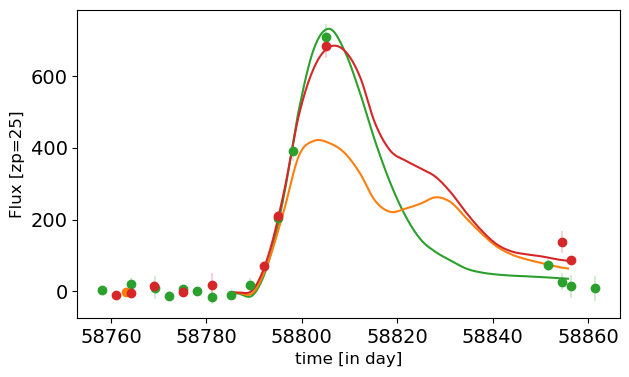

In [169]:
_=dset.show_target_lightcurve(index=10, format_time=False, phase_window=[-50, 60])

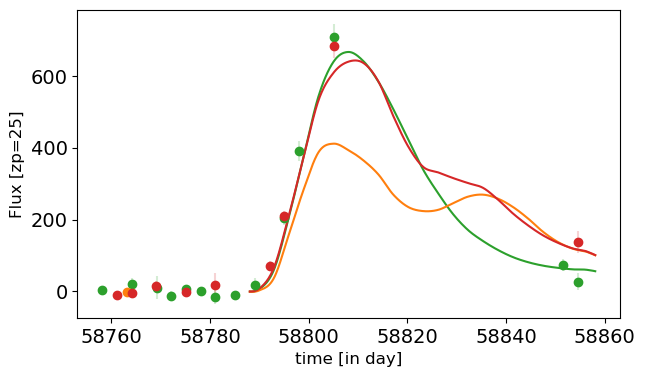

In [162]:
_=dset_ztf.show_target_lightcurve(index=10, format_time=False)
plt.savefig("../figures/Rapports/10_lc_pets_new.png")

In [ ]:
for i in tqdm(data_ztf[data_ztf.valid].index):
    dset_ztf.show_target_lightcurve(index=i, phase_window=[-100,200])
    plt.title(f"SN {i}")
    plt.savefig(f"../figures/PETS_Uchuu/{i}_lc.png")
    plt.close()
    grid=np.loadtxt('pets/Tgrid/%s.dat' %i).transpose()
    if (np.size(grid)>10):
        Tmax,x0_grid,ex0_grid,x1_grid,ex1_grid,c_grid,ec_grid,chi2_grid=grid[0],grid[1],grid[2],grid[3],grid[4],grid[5],grid[6],grid[-2]
        fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12,12))
        t_range =(0,-1)
        axs[0,0].plot(Tmax[t_range[0]:t_range[1]], chi2_grid[t_range[0]:t_range[1]])
        axs[0,0].vlines(dset.targets.data.loc[i,'t0'], *axs[0,0].get_ylim(), color="tab:red", linestyle=':', label='Truth')
        axs[0,0].vlines(dset_ztf.targets.data.loc[i,'t0'], *axs[0,0].get_ylim(), color="tab:green", linestyle=':', label='PETS')
        axs[0,0].hlines(data_ztf.loc[i,'X2min']*1.5, Tmax[t_range[0]], Tmax[t_range[1]], linestyle='--', color='k')
        axs[0,0].legend()
        axs[0,0].set_yscale("log")
        axs[0,0].set_ylabel(r"$\chi^2$")
        axs[0,0].set_xlabel(r"$T_{max}$")

        axs[0,1].fill_between(Tmax[t_range[0]:t_range[1]],
                              x0_grid[t_range[0]:t_range[1]] - ex0_grid[t_range[0]:t_range[1]],
                              x0_grid[t_range[0]:t_range[1]] + ex0_grid[t_range[0]:t_range[1]],
                              alpha=0.2,
                             )
        axs[0,1].plot(Tmax[t_range[0]:t_range[1]], x0_grid[t_range[0]:t_range[1]])
        axs[0,1].set_yscale("log")
        axs[0,1].set_ylabel(r"$x_0$")
        axs[0,1].set_xlabel(r"$T_{max}$")
        axs[0,1].vlines(dset.targets.data.loc[i,'t0'], *axs[0,1].get_ylim(), color="tab:red", linestyle=':', label='Truth')
        axs[0,1].vlines(dset_ztf.targets.data.loc[i,'t0'], *axs[0,1].get_ylim(), color="tab:green", linestyle=':', label='PETS')
        axs[0,1].hlines([dset.targets.data.loc[i,'x0'], dset_ztf.targets.data.loc[i,'x0']], *axs[0,1].get_xlim(), color=["tab:red", "tab:green"], linestyle=':')
        axs[0,1].legend()
        
        axs[1,0].fill_between(Tmax[t_range[0]:t_range[1]],
                              x1_grid[t_range[0]:t_range[1]] - ex1_grid[t_range[0]:t_range[1]],
                              x1_grid[t_range[0]:t_range[1]] + ex1_grid[t_range[0]:t_range[1]],
                              alpha=0.2,
                             )
        axs[1,0].plot(Tmax[t_range[0]:t_range[1]], x1_grid[t_range[0]:t_range[1]])
        axs[1,0].set_ylabel(r"$x_{1}$")
        axs[1,0].set_xlabel(r"$T_{max}$")
        axs[1,0].vlines(dset.targets.data.loc[i,'t0'], *axs[1,0].get_ylim(), color="tab:red", linestyle=':', label='Truth')
        axs[1,0].vlines(dset_ztf.targets.data.loc[i,'t0'], *axs[1,0].get_ylim(), color="tab:green", linestyle=':', label='PETS')
        axs[1,0].hlines([dset.targets.data.loc[i,'x1'], dset_ztf.targets.data.loc[i,'x1']], *axs[1,0].get_xlim(), color=["tab:red", "tab:green"], linestyle=':')
        axs[1,0].legend()
        
        axs[1,1].fill_between(Tmax[t_range[0]:t_range[1]],
                              c_grid[t_range[0]:t_range[1]] - ec_grid[t_range[0]:t_range[1]],
                              c_grid[t_range[0]:t_range[1]] + ec_grid[t_range[0]:t_range[1]],
                              alpha=0.2,
                             )
        axs[1,1].plot(Tmax[t_range[0]:t_range[1]], c_grid[t_range[0]:t_range[1]])
        axs[1,1].set_ylabel(r"$c$")
        axs[1,1].set_xlabel(r"$T_{max}$")
        axs[1,1].vlines(dset.targets.data.loc[i,'t0'], *axs[1,1].get_ylim(), color="tab:red", linestyle=':', label='Truth')
        axs[1,1].vlines(dset_ztf.targets.data.loc[i,'t0'], *axs[1,1].get_ylim(), color="tab:green", linestyle=':', label='PETS')
        axs[1,1].hlines([dset.targets.data.loc[i,'c'], dset_ztf.targets.data.loc[i,'c']], *axs[1,1].get_xlim(), color=["tab:red", "tab:green"], linestyle=':')
        axs[1,1].legend()
        
        fig.suptitle(f"SN {i}")
        plt.savefig(f"../figures/PETS_Uchuu/{i}_pets.png")
    plt.close()

  0%|          | 0/1032 [00:00<?, ?it/s]

2024-09-30 08:14:17,982 WARNING Pandas support in corner is deprecated; use ArviZ directly


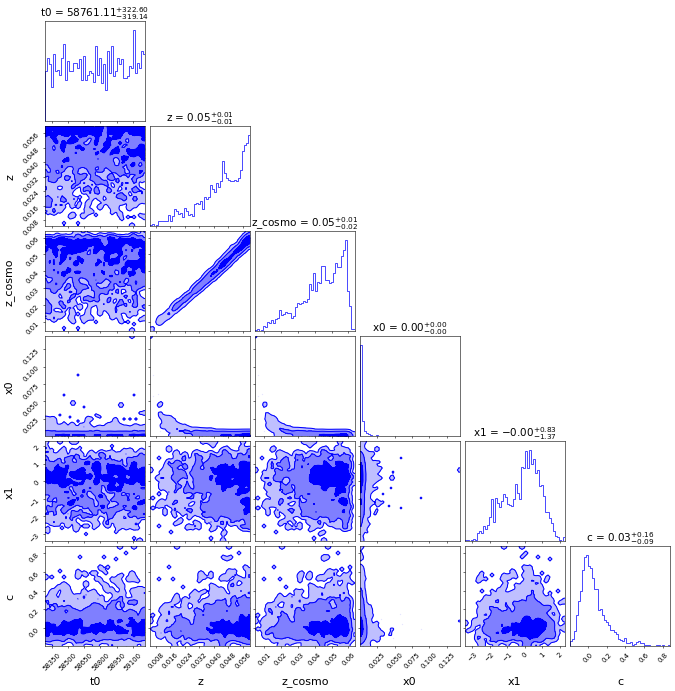

In [3]:
_= corner_(data_ztf, var_names=["t0","z", "z_cosmo", "x0", "x1", "c"])

# SALT

## Reconstructed parameters

In [168]:
import sncosmo
M0=sncosmo.SALT2Source(modeldir='./data/SALT_snf', m0file='nacl_m0_test.dat', m1file='nacl_m1_test.dat', clfile='nacl_color_law_test.dat').peakmag('bessellb', 'ab')
M0

10.508547819764999

In [169]:
data_ztf = pandas.read_csv("data/pets_uchuu/Results/mock_sne.csv", index_col=0).reset_index(drop=True)
data_snls = pandas.read_csv("data/pets_snls/Results/mock_sne.csv")
data_snls.reset_index(inplace=True, drop=True)
data_snls.name += 10000
data_snls.sn += 10000
data_snls.survey='SNLS'
data_tot = pandas.concat([data_ztf, data_snls])


In [170]:
with open("outdir/SN_Uchuu.pkl", "rb") as file:
    data_ztf_true = pickle.load(file)

with open("outdir/dataset_snls.pkl", "rb") as file:
    data_snls_true = pickle.load(file)
data_truth = pandas.concat([data_ztf_true, data_snls_true]).drop(columns=["redshift", "calc_z_cosmo", "used_edris", "converged", "valid", "keep"])

data_truth = data_truth[np.array(data_tot.valid==1)].copy()
data_tot = data_tot[data_tot.valid==1].copy()

In [171]:
data_tot["Mb"] = -2.5*np.log10(data_tot["x0"]) + M0
data_truth["Mb"] = -2.5*np.log10(data_truth["x0"]) + M0

In [172]:
data_tot["cov_Mb"] = (2.5/(np.log(10)*data_tot["x0"]))**2*data_tot["err_x0"]**2

In [173]:
data_tot["err_Mb"] = np.sqrt(data_tot["cov_Mb"])

In [174]:
alpha, beta = -0.14,  3.15

data_tot['mu'] = data_tot['Mb'] - alpha * data_tot["x1"] - beta * data_tot["c"]
data_tot["cov_mu"] = data_tot["cov_Mb"] + np.abs(alpha)**2 * data_tot["err_x1"]**2 + np.abs(beta)**2 * data_tot["err_c"]**2
data_tot['err_mu'] = np.sqrt(np.array(data_tot["cov_mu"]))

In [175]:
data_truth['Mb'] = -2.5 * np.log10(data_truth["x0"]) + M0
data_truth['mu'] = data_truth['Mb'] - alpha * data_truth["x1"] - beta * data_truth["c"]

In [63]:
def plot_res(data, data_truth, col, label, unit=None, emph_index=None, log=False, linthresh=1e-3):
    fig, axs = plt.subplots(nrows=2, sharex='col', figsize=(5,5))
    axs[0].errorbar(data_truth[col], data[col],
                      yerr = data["err_"+col] if "err_"+col in data.columns else None,
                      linestyle="", marker=".")
    
    axs[0].plot([data_truth[col].min() - 1e-3, data_truth[col].max() + 1e-3], [data_truth[col].min() - 1e-3, data_truth[col].max() + 1e-3], linestyle=':', color='r')
    delta = data_truth[col] - data[col] 
    axs[1].errorbar(data_truth[col], delta,
                      yerr = data["err_"+col] if "err_"+col in data.columns else None,
                      linestyle="", marker=".")
    axs[1].axhline(0, linestyle=':', color='r')
    if log:
        axs[0].loglog()
        axs[1].semilogx()
    if unit:
        axs[0].set_ylabel(label + ' (' + unit + ')')
        axs[1].set_xlabel(label.lower() + '$_{Truth}$ (' + unit + ')')
        axs[1].set_ylabel('$\Delta$' + label.lower() + ' (' + unit + ')')
    else:
        axs[0].set_ylabel(label)
        axs[1].set_xlabel(label.lower() + '$_{Truth}$')
        axs[1].set_ylabel('$\Delta$' + label.lower())
    
    if emph_index:
        axs[0].errorbar(data_truth.loc[emph_index, col], data.loc[emph_index, col],
                  yerr = data.loc[emph_index, "err_"+col] if "err_"+col in data.columns else None,
                  linestyle="", marker=".", color="cyan", ecolor="cyan", elinewidth=1)
        axs[1].errorbar(data_truth.loc[emph_index, col], delta.loc[emph_index],
                  yerr = data.loc[emph_index, "err_"+col] if "err_"+col in data.columns else None,
                  linestyle="", marker=".", color="cyan", ecolor="cyan", elinewidth=1)
    axs[1].set_box_aspect(0.3)
    
    plt.tight_layout()

In [96]:
filt = (data_tot.err_c < 0.07) & (data_tot.err_x1 < 1)

In [97]:
data_tot = data_tot[filt].copy()
data_truth = data_truth[filt].copy()

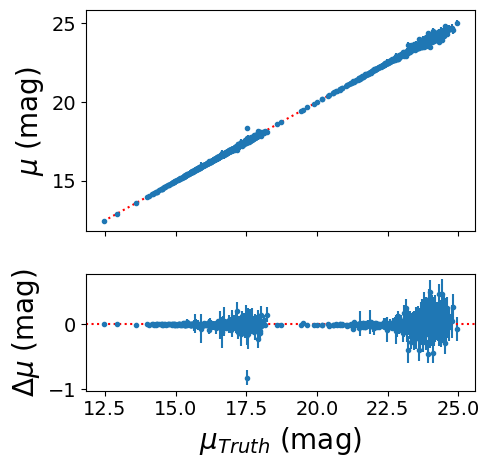

In [104]:
plot_res(data_tot, data_truth, "mu", "$\mu$", 'mag')
plt.savefig('../figures/Rapports/salt_mu_new.png')

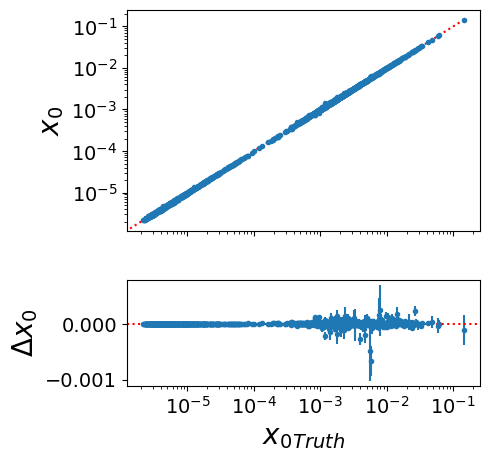

In [105]:
plot_res(data_tot, data_truth, "x0", "$x_0$",
         log=True,
         linthresh=1e-6)
plt.savefig("../figures/Rapports/salt_x0_new.png")

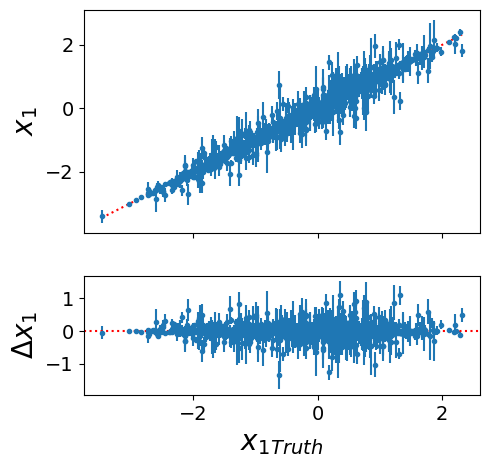

In [107]:
plot_res(data_tot, data_truth, "x1", "$x_1$")
plt.savefig("../figures/Rapports/salt_x1_new.png")

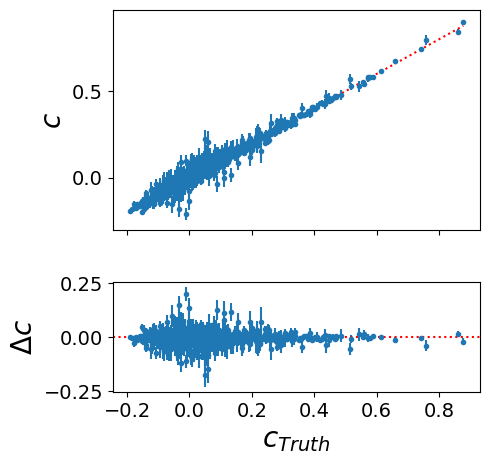

In [108]:
plot_res(data_tot, data_truth, "c", "$c$")
plt.savefig("../figures/Rapports/salt_c_new.png")

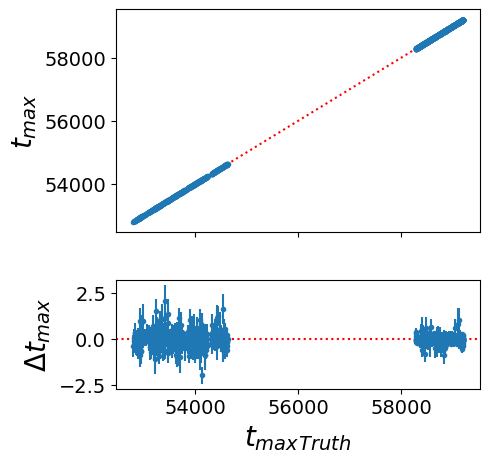

In [103]:
data_tot.rename(columns={"t0":"tmax"}, inplace=True)
data_truth.rename(columns={"t0":"tmax"}, inplace=True)
plot_res(data_tot, data_truth, "tmax", "$t_{max}$")
plt.savefig("../figures/Rapports/salt_tmax_new.png")

## EDRIS on SALT2.4

In [11]:
with open("outdir/dataset_snls.pkl", "rb") as f:
    data_snls = pickle.load(f)
    lc_snls = pickle.load(f)
    # res_sn_snls = pickle.load(f)
    # meta_snls = pickle.load(f)
data_snls["survey"] = "SNLS"

In [12]:
with open("outdir/SN_Uchuu.pkl", "rb") as f:
    data_ztf = pickle.load(f)
    lc_ztf = pickle.load(f)
    res_sn_ztf = pickle.load(f)
    meta_ztf = pickle.load(f)
data_ztf["survey"] = "ZTF"

In [13]:
data_snls.index += 10000
data_tot = pandas.concat([data_ztf, data_snls])

In [3]:
from edris.tools import linear_interpolation
from astropy.constants import c

def integrand(Omega_m, Omega_r, Omega_l, u):
    return 1 / jnp.sqrt(Omega_m + Omega_r * u ** (-2) + Omega_l * u**6)


def dist(
    z,
    Omega_m=Planck15.Om0,
    Omega_r=5e-5,
    Omega_l=Planck15.Ode0,
    H0=Planck15.H0.value,
    nstep=10000,
    **kwargs
):
    dh = c.value * 1e-3 / H0
    u = 1 / jnp.sqrt(1 + z)
    umin = 0.02
    step = (1 - umin) / nstep
    _u = jnp.arange(umin + 0.5 * step, 1, step)
    csum = jnp.cumsum(integrand(Omega_m, Omega_r, Omega_l, _u[-1::-1]))[-1::-1]
    R = linear_interpolation(u, csum, _u - 0.5 * step) * 2 * step * dh
    return R

def cosmo(params, exp):
    return 5.0 * jnp.log10(abs(exp["z"] + 1.0) * dist(exp["z"], **params)) + params.get("M0", 25-19.3)

In [20]:
with open("outdir/Uchuu_snls_edris_res.pkl", "rb") as file:
    exp = pickle.load(file)
    obs = pickle.load(file)
    cov = pickle.load(file)
    res = pickle.load(file)
    hess = pickle.load(file)

x0 = {
    # "mu_bins": jnp.array(mag_Planck15(exp['z_bins'])),
    "Omega_m": jnp.array([Planck15.Om0]),
    # "Omega_r": jnp.array([5e-5]),
    "Omega_l": jnp.array([Planck15.Ode0]),
    "H0": jnp.array([Planck15.H0.value]),
    "coef": jnp.array([-0.14, 3.15]),
    "variables": jnp.array(obs.variables.reshape((2, -1))),
    # "sigma_int":jnp.array([0.1]),
    # "M0":jnp.array([25 - 19.3]),
}

n = {k1:hess[k1][k1].shape[1] for k1 in hess.keys()}
n["variables"]*=n["coef"]
flatten_hess = jnp.vstack([np.hstack([hess[k1][k2].reshape(n[k1], n[k2]) for k2 in hess.keys()]) for k1 in hess.keys()])
cov_res = jnp.linalg.inv(0.5 * flatten_hess)

std_mag = obs.mag - jnp.matmul(res["coef"], res["variables"])

In [15]:
filt = np.array([np.any(np.isclose(data_tot[data_tot.survey=='ZTF'].z, float(z)))  for z in exp["z"]])

Text(0.5, 0, '$z$')

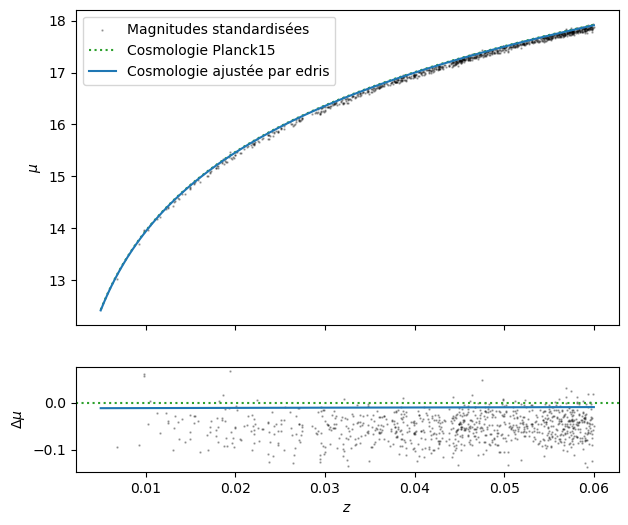

In [17]:
fig, (ax1, ax2) = plt.subplots(
    nrows=2, sharex="col", figsize=(7, 6), gridspec_kw={"height_ratios": [3, 1]}
)

ax1.scatter(
    exp["z"][filt], std_mag[filt], s=0.5, alpha=0.3, color="k",
    # label="Magnitudes standardisées\n"+rf'$\alpha =${res["coef"][0]:.3f} $\pm${np.sqrt(cov_res[2][2]):.3f}; $\beta =$ {res["coef"][1]:.3f} $\pm${np.sqrt(cov_res[3][3]):.3f}'
    label="Magnitudes standardisées"
)
ax1.plot(
    np.linspace(5e-3, 0.06, 1000),
    cosmo(x0, {'z':np.linspace(5e-3, 0.06, 1000)}),
    color="tab:green",
    linestyle=":",
    label="Cosmologie Planck15",
)

ax2.scatter(exp["z"][filt], std_mag[filt] - cosmo(x0, exp)[filt], color="k", s=0.5, alpha=0.3)

if "mu_bins" in res.keys():
    ax1.errorbar(
        exp["z_bins"][filt],
        res["mu_bins"][filt],
        yerr=jnp.sqrt(jnp.diag(cov_res[2 : 2 + n_bins, 2 : 2 + n_bins]))[filt],
        color="tab:blue",
        label="edris",
    )
    ax2.errorbar(
        exp["z_bins"][filt],
        res["mu_bins"][filt] - cosmo(x0, {"z" : exp["z_bins"]})[filt],
        yerr=jnp.sqrt(jnp.diag(cov_res[2 : 2 + n_bins, 2 : 2 + n_bins]))[filt],
        color="tab:blue",
    )
else:
    ax1.plot(
        jnp.linspace(5e-3, 0.06, 1000),
        cosmo(res, {"z": jnp.linspace(5e-3, 0.06, 1000)}),
        color="tab:blue",
        # label="Cosmologie ajustée par edris\n"+rf'$H_0 =${res["H0"][0]:.1f} $\pm${np.sqrt(cov_res[0][0]):.1f}; $\Omega_\Lambda =$ {res["Omega_l"][0]:.3f} $\pm${np.sqrt(cov_res[1][1]):.3f}',
        label="Cosmologie ajustée par edris",
    )
    ax2.plot(
        jnp.linspace(5e-3, 0.06, 1000),
        cosmo(res, {"z": jnp.linspace(5e-3, 0.06, 1000)}) - cosmo(x0, {"z":jnp.linspace(5e-3, 0.06, 1000)}),
        color="tab:blue",
    )


ax1.legend()
ax1.set_ylabel(r"$\mu$")

lims = ax2.get_xlim()
ax2.hlines(0.0, xmin=lims[0], xmax=lims[1], color="tab:green", linestyle=":")
ax2.set_xlim(*lims)
ax2.set_ylabel(r"$\Delta\mu$")
ax2.set_xlabel(r"$z$")

# fig.suptitle(r"Modèle $\Lambda$CDM ajusté par Edris à partir de SALT2.4")
# plt.savefig("../figures/Rapports/salt_cosmo")

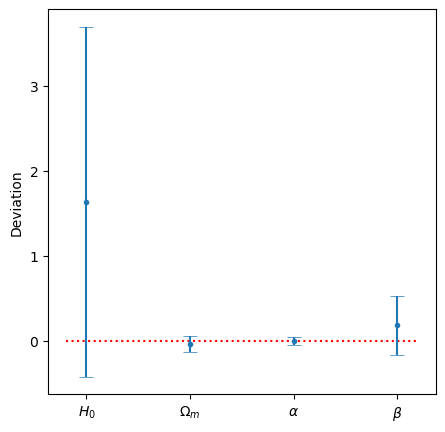

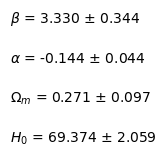

In [21]:
fig, ax = plt.subplots(figsize=(5,5))
keys = np.array(list(res.keys()))[[p in potential_keys for p in res.keys()]]
labels, values, diffs = [], [], []
for k in keys:
    labels += latex_keys[k] if isinstance(latex_keys[k], list) else [latex_keys[k]]
    values += list(res[k])
    diffs +=  list(res[k] - x0[k])
n_pars = len(keys)
ax.hlines(0, -1, 5*n_pars+1, color='r', linestyle=':')
ax.set_xticks(5*np.arange(n_pars+1), labels)
ax.set_ylabel('Deviation')
plt.errorbar(5*np.arange(n_pars+1), diffs,
             yerr= jnp.sqrt(jnp.diag(cov_res)[:n_pars+1]),
             linestyle='',
             marker='.',
             capsize=5,
             capthick=.5)
# plt.savefig('../figures/Uchuu_final_params.png')
fig, ax = plt.subplots(figsize=(1,1))
ax.axis("off")
for i, pos in enumerate(np.arange(n_pars+1)*.4):
    fig.text(0, pos, labels[i] + f" = {values[i]:.3f} $\\pm$ {jnp.sqrt(jnp.diag(cov_res)[i]):.3f}")
# plt.savefig('../figures/Rapports/salt_cosmo_params.png')

# NaCl related

In [4]:
import sncosmo
from nacl.train import TrainSALT2Like

wl = np.linspace(2000, 11000, 3000)
ph = np.linspace(50, -20, 3000)
WL, PH = np.meshgrid(wl, ph)

source = sncosmo.SALT2Source(modeldir='./data/SALT_snf', m0file='nacl_m0_test.dat', m1file='nacl_m1_test.dat', clfile='nacl_color_law_test.dat')

# model_sncosmo = sncosmo.Model(source=source,effects=[sncosmo.CCM89Dust()],effect_names=['mw'],effect_frames=['obs'])
sn_cosmo_M0 = source._model['M0'](ph, wl) / source._SCALE_FACTOR
sn_cosmo_M1 = source._model['M1'](ph, wl) / source._SCALE_FACTOR


2024-11-13 04:01:11,524 INFO sparse_dot_mkl found. Building hessian should be faster.
2024-11-13 04:01:11,527 INFO sparse_dot_mkl found. Building hessian should be faster.


## Models

### Single trainer plots

In [10]:
trainer = TrainSALT2Like.load("outdir/test.pkl")
# trainer = TrainSALT2Like.load('/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/nacl_Uchuu_snls_extended.pkl')

In [13]:
pars_init= trainer.model.init_pars()

J = trainer.model.basis.eval(WL.ravel(), PH.ravel())
M0 = (J @ pars_init['M0'].full).reshape((len(wl), len(ph)))
M1 = (J @ pars_init['M1'].full).reshape((len(wl), len(ph)))

pars_trained = trainer.log[-1].pars
M0_trained = (J @ pars_trained['M0'].full).reshape((len(wl), len(ph)))
M1_trained = (J @ pars_trained['M1'].full).reshape((len(wl), len(ph)))

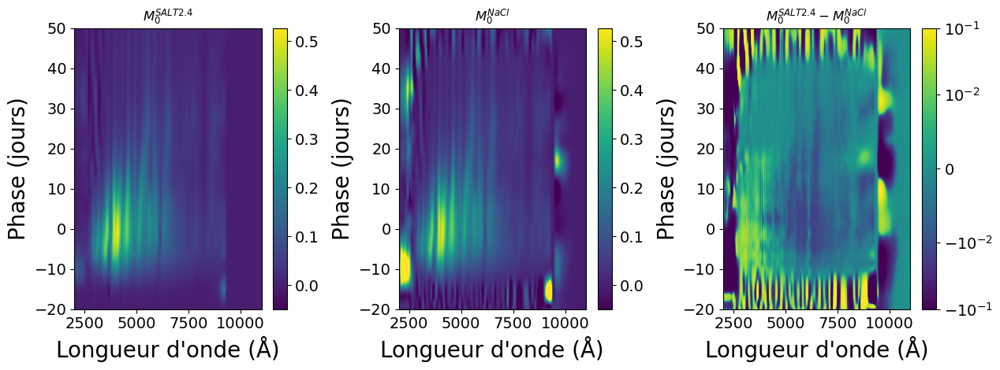

In [14]:
import matplotlib as mpl

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=[12.8, 4.8])

im = axs[0].imshow(sn_cosmo_M0, extent=[2000, 11000, -20, 50], aspect='auto', origin='upper')
plt.colorbar(im, ax=axs[0])
axs[0].set_ylabel("Phase (jours)")
axs[0].set_xlabel("Longueur d'onde (Å)")
axs[0].set_title("$M_0^{SALT2.4}$")

im = axs[1].imshow(M0_trained, extent=[2000, 11000, -20, 50], aspect='auto', origin='upper',
                   vmin=sn_cosmo_M0.min(), vmax=sn_cosmo_M0.max()
                  )
plt.colorbar(im, ax=axs[1])
axs[1].set_ylabel("Phase (jours)")
axs[1].set_xlabel("Longueur d'onde (Å)")
axs[1].set_title("$M_0^{NaCl}$")

im = axs[2].imshow(sn_cosmo_M0 - M0_trained, extent=[2000, 11000, -20, 50], aspect='auto',
                   norm=mpl.colors.SymLogNorm(linthresh=1e-2, vmin=-0.1, vmax=0.1),
                   origin='upper')
plt.colorbar(im, ax=axs[2])
axs[2].set_ylabel("Phase (jours)")
axs[2].set_xlabel("Longueur d'onde (Å)")
axs[2].set_title("$M_0^{SALT2.4} - M_0^{NaCl}$")


plt.tight_layout()
# plt.savefig("../figures/Rapports/nacl_m0.png")

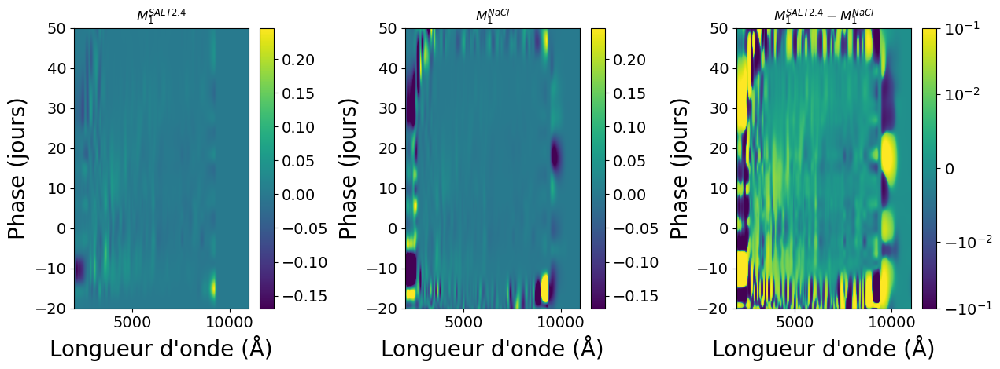

In [15]:
import matplotlib as mpl

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=[12.8, 4.8])

im = axs[0].imshow(sn_cosmo_M1, extent=[2000, 11000, -20, 50], aspect='auto', origin='upper')
plt.colorbar(im, ax=axs[0])
axs[0].set_ylabel("Phase (jours)")
axs[0].set_xlabel("Longueur d'onde (Å)")
axs[0].set_title("$M_1^{SALT2.4}$")

im = axs[1].imshow(M1_trained, extent=[2000, 11000, -20, 50], aspect='auto', origin='upper', vmin=sn_cosmo_M1.min(), vmax=sn_cosmo_M1.max())
plt.colorbar(im, ax=axs[1])
axs[1].set_ylabel("Phase (jours)")
axs[1].set_xlabel("Longueur d'onde (Å)")
axs[1].set_title("$M_1^{NaCl}$")

im = axs[2].imshow(sn_cosmo_M1 - M1_trained, extent=[2000, 11000, -20, 50], aspect='auto', norm=mpl.colors.SymLogNorm(linthresh=1e-2, vmin=-0.1, vmax=0.1), origin='upper')
plt.colorbar(im, ax=axs[2])
axs[2].set_ylabel("Phase (jours)")
axs[2].set_xlabel("Longueur d'onde (Å)")
axs[2].set_title("$M_1^{SALT2.4} - M_1^{NaCl}$")

plt.tight_layout()
# plt.savefig("../figures/Rapports/nacl_m1.png")

NameError: name 'cov_matrix' is not defined

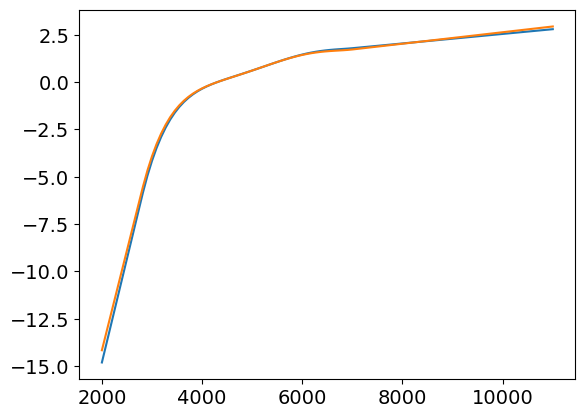

In [8]:
borders = np.cumsum([len(pars_trained[par]._pars) for par in pars_trained._struct])

pars_labels = {'X0':r'$x_0$',
               'X1':r'$x_1$',
               'c':r'$c$',
               'tmax':r'$t_{max}$',
               'M0':r'$M_0$',
               'M1':r'$M_1$',
               'CL':r'$CL$',
               'SpectrumRecalibration':r'$SpRec$',
               'gamma':r'$\gamma$',
               'gamma_snake':r'$\gamma_{snake}$',
               'gamma_sn':r'$\gamma_{SN}$'}

wl = np.linspace(2000, 11000, 100)
plt.plot(wl, trainer.model.color_law(wl, pars_init["CL"]._pars)[0], label='SALT2.4')
plt.plot(wl, trainer.model.color_law(wl, pars_trained["CL"]._pars)[0], label='NaCl')
cl_id_high = np.where(np.array(list(pars_trained._struct))=='CL')[0][0]
cl_id_low = cl_id_high - 1
plt.fill_between(wl,
                 trainer.model.color_law(wl, pars_trained["CL"]._pars - np.sqrt(np.diag(cov_matrix[borders[cl_id_low]:borders[cl_id_high],borders[cl_id_low]:borders[cl_id_high]])))[0],
                 trainer.model.color_law(wl, pars_trained["CL"]._pars + np.sqrt(np.diag(cov_matrix[borders[cl_id_low]:borders[cl_id_high],borders[cl_id_low]:borders[cl_id_high]])))[0],
                 alpha=0.2,
                 color='tab:orange',
                 label=r'NaCl $\pm 1 \sigma$')
plt.legend(loc='upper left')
plt.ylim(-15, 5)
plt.xlabel(r"Longueur d'onde $\lambda$ (Å)")
plt.ylabel(r"$CL(\lambda)$")
# plt.savefig("../figures/Rapports/nacl_cl.png")

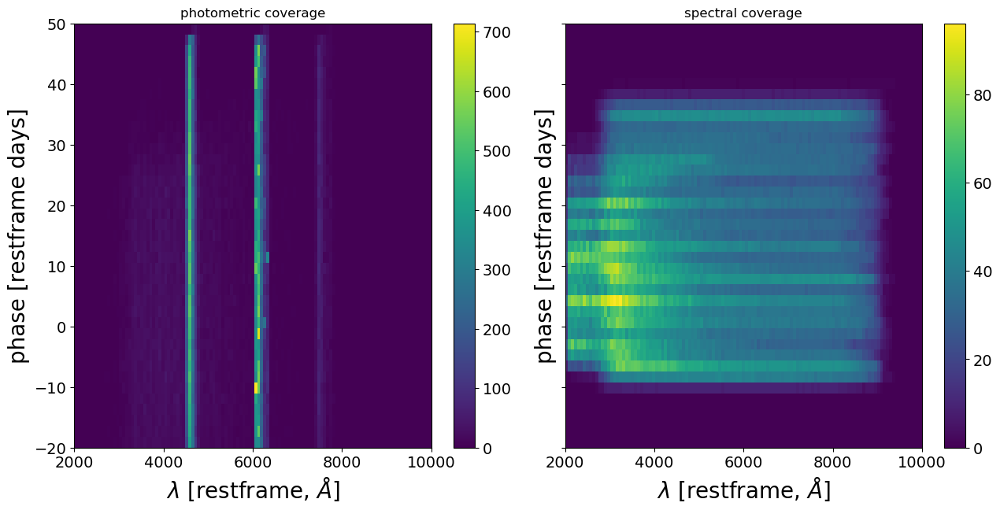

In [16]:
trainer.tds.plot_coverage()
# plt.savefig("../figures/Rapports/nacl_coverage")

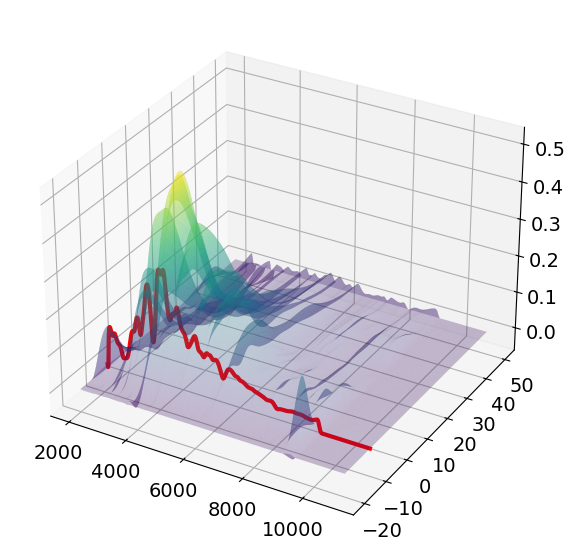

In [133]:
%matplotlib inline
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'), figsize=(7,7))
ax.plot_surface(WL, PH, M0, cmap='viridis', rstride=5, cstride=5, alpha=.3)
ax.plot(WL[2500], PH[2500], M0[2500], color="r", linewidth=3)
plt.savefig("../figures/Rapports/model_w_spectra.png")

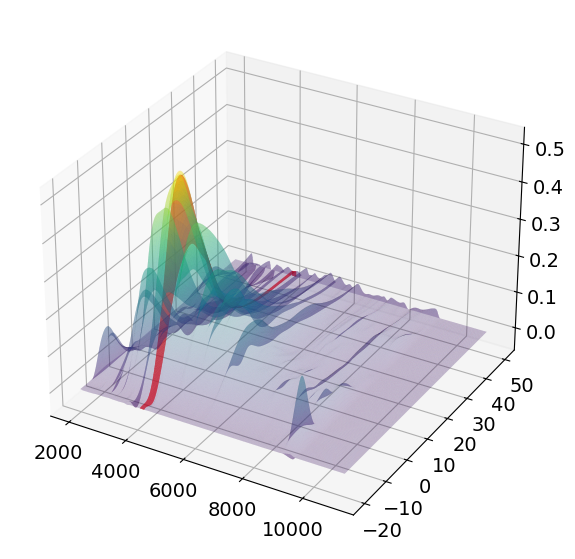

In [148]:
%matplotlib inline
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'), figsize=(7,7))
ax.plot_surface(WL, PH, M0, cmap='viridis', rstride=5, cstride=5, alpha=.3)
ax.plot_surface(WL[:, 700:750], PH[:, 700:750], M0[:, 700:750], rstride=5, cstride=5, color="r", shade=False, alpha=1)
plt.savefig("../figures/Rapports/model_w_lc.png")

(-10.0, 40.0)

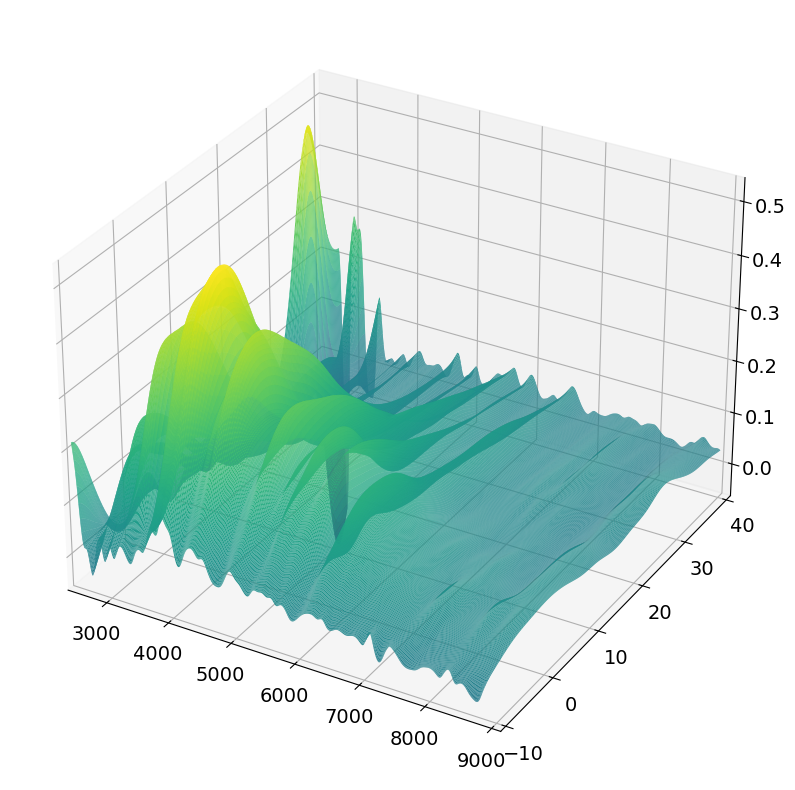

In [17]:
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'), figsize=(10,10))
ax.plot_surface(WL[350:-350,200:-700], PH[350:-350,200:-700], M0_trained[350:-350,200:-700], cmap='viridis', rstride=5, cstride=5)
ax.set_zlim(M0.min(), M0.max())
ax.set_xlim(2500, 9000)
ax.set_ylim(-10, 40)

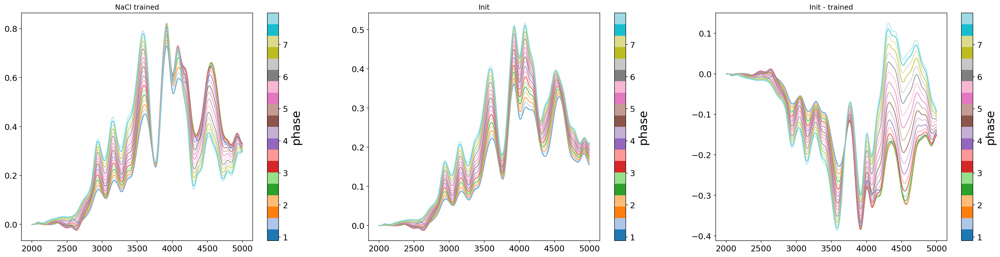

In [246]:
import matplotlib as mpl
fig, [ax_nacl, ax_init, ax_diff] = plt.subplots(ncols=3, figsize=(30,7), dpi=150)
n = 20
start, stop = 1800, 2100

cmap = plt.cm.tab20

ax_nacl.set_prop_cycle(color=cmap(np.linspace(0, 1, n)))
ax_init.set_prop_cycle(color=cmap(np.linspace(0, 1, n)))
ax_diff.set_prop_cycle(color=cmap(np.linspace(0, 1, n)))

wl_range=(0,1000)

for i in np.linspace(start, stop, n):
    ax_nacl.plot(WL[int(i),wl_range[0]:wl_range[1]],
                 M0_trained[int(i),wl_range[0]:wl_range[1]],
                 label = f"phase {ph[int(i)]:.2f}",
                 alpha=0.7)
    ax_init.plot(WL[int(i),wl_range[0]:wl_range[1]],
                 M0[int(i),wl_range[0]:wl_range[1]],
                 label = f"phase {ph[int(i)]:.2f}",
                 alpha=0.7)
    ax_diff.plot(WL[int(i),wl_range[0]:wl_range[1]],
                 M0[int(i),wl_range[0]:wl_range[1]] - M0_trained[int(i),wl_range[0]:wl_range[1]],
                 label = f"phase {ph[int(i)]:.2f}",
                 alpha=0.7)

# ax_nacl.set_yscale("symlog", linthresh=1e-5)
ax_nacl.set_title("NaCl trained")

# ax_sncosmo.set_yscale("symlog", linthresh=1e-5)
ax_init.set_title("Init")

ax_diff.set_title("Init - trained")

plt.colorbar(mpl.cm.ScalarMappable(norm = mpl.colors.Normalize(vmin=ph[start], vmax=ph[stop]), cmap=cmap), ax = ax_init, label="phase")
plt.colorbar(mpl.cm.ScalarMappable(norm = mpl.colors.Normalize(vmin=ph[start], vmax=ph[stop]), cmap=cmap), ax = ax_nacl, label="phase")
plt.colorbar(mpl.cm.ScalarMappable(norm = mpl.colors.Normalize(vmin=ph[start], vmax=ph[stop]), cmap=cmap), ax = ax_diff, label="phase")
# plt.savefig("../figures/nacl_sncosmo_spec_low_ph.png")

### Multiple trainer plots

In [5]:
trainer_1em1 = TrainSALT2Like.load("/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_0.1.pkl")
trainer_1e0 = TrainSALT2Like.load("/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_1.0.pkl")
trainer_1e1 = TrainSALT2Like.load("/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_10.0.pkl")
trainer_1e2 = TrainSALT2Like.load("/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_100.0.pkl")
trainer_1e3 = TrainSALT2Like.load("/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_1000.0.pkl")
trainer_1e4 = TrainSALT2Like.load("/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_10000.0.pkl")
trainer_1e5 = TrainSALT2Like.load("/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_100000.0.pkl")



In [6]:
trainers=[trainer_1em1, trainer_1e0, trainer_1e1, trainer_1e2, trainer_1e3, trainer_1e4, trainer_1e5]

In [9]:
pars_init= trainers[0].model.init_pars()

wl = np.linspace(2000, 11000, 3000)
ph = np.linspace(50, -20, 3000)
WL, PH = np.meshgrid(wl, ph)
J = trainers[0].model.basis.eval(WL.ravel(), PH.ravel())
M0 = (J @ pars_init['M0'].full).reshape((len(wl), len(ph)))
M1 = (J @ pars_init['M1'].full).reshape((len(wl), len(ph)))

M0_trained, M1_trained = [], []
for trainer in trainers:
    pars_trained = trainer.log[-1].pars
    M0_trained.append((J @ pars_trained['M0'].full).reshape((len(wl), len(ph))))
    M1_trained.append((J @ pars_trained['M1'].full).reshape((len(wl), len(ph))))

In [12]:
label=["$\mu_{reg}=10^{-1}$", "$\mu_{reg}=10^{0}$", "$\mu_{reg}=10^{1}$",
       "$\mu_{reg}=10^{2}$", "$\mu_{reg}=10^{3}$", "$\mu_{reg}=10^{4}$", "$\mu_{reg}=10^{5}$"]

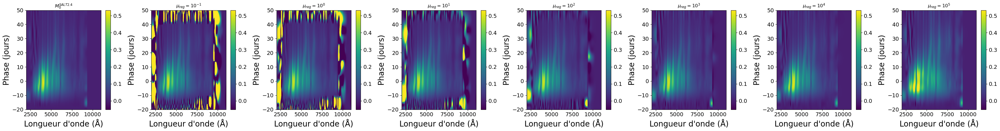

In [13]:
fig, axs = plt.subplots(nrows=1, ncols=len(trainers) + 1, figsize=[5*len(trainers)+1, 4.8])

for i, (M0_, l) in enumerate(zip([M0] + M0_trained, ["$M_0^{SALT2.4}$"] + label)):
    im = axs[i].imshow(M0_, extent=[2000, 11000, -20, 50], vmin = np.min(M0), vmax = np.max(M0), aspect='auto', origin='upper')
    axs[i].set_ylabel("Phase (jours)")
    axs[i].set_xlabel("Longueur d'onde (Å)")
    axs[i].set_title(l)

    plt.colorbar(im, ax=axs[i])
plt.tight_layout()
# plt.savefig("../figures/Rapports/mu_reg_M0.png")

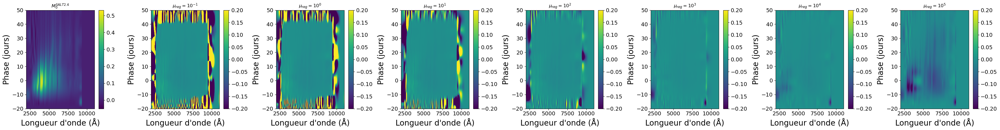

In [17]:
fig, axs = plt.subplots(nrows=1, ncols=len(trainers)+1, figsize=[5*len(trainers)+1, 4.8])

for i, (M0_, l) in enumerate(zip([M0] + [M0 - M0_tr for M0_tr in M0_trained], ["$M_0^{SALT2.4}$"] + label )):
    im = axs[i].imshow(M0_, extent=[2000, 11000, -20, 50], vmin=-0.2 if i>0 else np.min(M0), vmax=0.2 if i>0 else np.max(M0), aspect='auto', origin='upper')
    axs[i].set_ylabel("Phase (jours)")
    axs[i].set_xlabel("Longueur d'onde (Å)")
    axs[i].set_title(l)

    plt.colorbar(im, ax=axs[i])
plt.tight_layout()
# plt.savefig("../figures/Rapports/mu_reg_M0_diff.png")

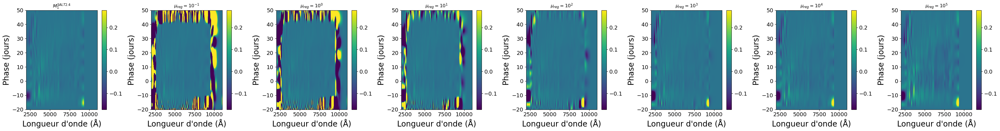

In [18]:
fig, axs = plt.subplots(nrows=1, ncols=len(trainers)+1, figsize=[5*len(trainers)+1, 4.8])

for i, (M1_, l) in enumerate(zip([M1] + M1_trained, ["$M_1^{SALT2.4}$"] + label)):
    im = axs[i].imshow(M1_, extent=[2000, 11000, -20, 50], vmin = np.min(M1), vmax = np.max(M1), aspect='auto', origin='upper')
    axs[i].set_ylabel("Phase (jours)")
    axs[i].set_xlabel("Longueur d'onde (Å)")
    axs[i].set_title(l)

    plt.colorbar(im, ax=axs[i])
plt.tight_layout()
# plt.savefig("../figures/Rapports/mu_reg_M1.png")

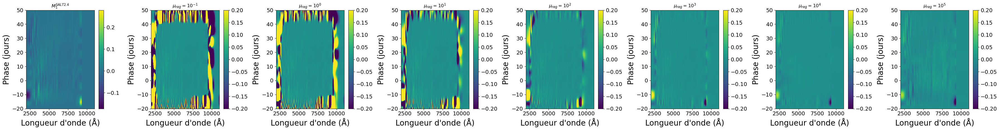

In [19]:
fig, axs = plt.subplots(nrows=1, ncols=len(trainers)+1, figsize=[5*len(trainers)+1, 4.8])

for i, (M1_, l) in enumerate(zip([M1] + [M1 - M1_tr for M1_tr in M1_trained], ["$M_1^{SALT2.4}$"] + label)):
    im = axs[i].imshow(M1_, extent=[2000, 11000, -20, 50], vmin=-0.2 if i>0 else np.min(M1), vmax=0.2 if i>0 else np.max(M1), aspect='auto', origin='upper')
    axs[i].set_ylabel("Phase (jours)")
    axs[i].set_xlabel("Longueur d'onde (Å)")
    axs[i].set_title(l)

    plt.colorbar(im, ax=axs[i])
plt.tight_layout()
# plt.savefig("../figures/Rapports/mu_reg_M1_diff.png")

In [21]:
for trainer in trainers[:3]:
    try:
        cov_matrix = trainer.log[-1].minz.get_cov_matrix()[0].toarray()
        with open(f"/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_{trainer.mu_reg}_cov.npz", "wb") as file:
            np.savez(file, cov_matrix)
    except:
        print(f"No cov for {trainer.mu_reg}")
        continue

2024-11-13 04:05:30,177 INFO chi2=2.335591e+05 | log_det_v=-7.826938e+06 | cons=6.440813e+01 | reg=2.262377e+04 | prior=0.000000e+00
2024-11-13 04:21:35,197 INFO chi2=2.233506e+05 | log_det_v=-7.571791e+06 | cons=8.295854e+01 | reg=5.617810e+04 | prior=0.000000e+00
2024-11-13 04:38:30,187 INFO chi2=2.230871e+05 | log_det_v=-7.341572e+06 | cons=1.004998e+02 | reg=1.168815e+05 | prior=0.000000e+00


In [22]:
cov_matrices = []
for trainer in trainers:
    with open(f"/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test_reg_{trainer.mu_reg}_cov.npz", "rb") as file:
         cov_matrices.append(np.load(file)['arr_0'])

In [23]:
n = len(trainers[0].tds.sn_data)

In [24]:
borders = np.cumsum([len(trainers[0].log[-1].pars[par]._pars) for par in trainers[0].log[-1].pars._struct])

In [25]:
pars_labels = {'X0':r'$x_0$',
               'X1':r'$x_1$',
               'c':r'$c$',
               'tmax':r'$t_{max}$',
               'M0':r'$M_0$',
               'M1':r'$M_1$',
               'CL':r'$CL$',
               'SpectrumRecalibration':r'$SpRec$',
               'gamma':r'$\gamma$',
               'gamma_snake':r'$\gamma_{snake}$',
               'gamma_sn':r'$\gamma_{SN}$'}

In [26]:
from scipy.sparse import csc_matrix

corr_matrices=[]
for cov_mat in cov_matrices:
    sigma = csc_matrix(jnp.diag(1/jnp.sqrt(jnp.diag(cov_mat)[:4*n])))
    corr_matrices.append((sigma @ csc_matrix(cov_mat[:4*n,:4*n]) @ sigma).toarray())

In [27]:
import matplotlib.colors as col
norm=col.SymLogNorm(linthresh=1e-3, vmin=-1, vmax=1)

In [ ]:
import matplotlib.colors as col
fig, axs = plt.subplots(nrows=1, ncols=len(trainers), figsize=[25*len(corr_matrices), 20])
for i, corr_mat in enumerate(corr_matrices):
    im = axs[i].imshow(corr_mat, norm=norm, cmap='RdBu')
    plt.colorbar(im, ax=axs[i])
plt.savefig("../figures/nacl_cooking_recipe/cov_matrices_reg.png")

## Covariances and reconstructed parameters

In [27]:
from nacl.train import TrainSALT2Like
trainer = TrainSALT2Like.load('/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test.pkl')

pars_trained = trainer.log[-1].pars
v_trained = trainer.log[-1].v

with np.load('/pscratch/sd/a/agillesl/Documents/Projet_LPNHE/test.npz') as dat:
    cov_matrix=dat['arr_0']
data_nacl = pandas.DataFrame(trainer.tds.sn_data.nt, index = trainer.tds.sn_data.nt["sn"]).drop(columns='index')

n = len(data_nacl)
cplt_perm = jnp.hstack([*[trainer.tds.sn_data.sn_index+k*n for k in range(3)]])
cov_ordered = cov_matrix[:3*n,:3*n][cplt_perm][:, cplt_perm]

data_nacl["err_x0"] = jnp.sqrt(jnp.diag(cov_ordered[:n,:n]))
data_nacl["err_x1"] = jnp.sqrt(jnp.diag(cov_ordered[n:2*n,n:2*n]))
data_nacl["err_c"] = jnp.sqrt(jnp.diag(cov_ordered[2*n:3*n,2*n:3*n]))
data_nacl["tmax"] = pars_trained["tmax"]._pars[trainer.tds.sn_data.sn_index]
data_nacl["x0"] = pars_trained["X0"]._pars[trainer.tds.sn_data.sn_index]
data_nacl["x1"] = pars_trained["X1"]._pars[trainer.tds.sn_data.sn_index]
data_nacl["c"] = pars_trained["c"]._pars[trainer.tds.sn_data.sn_index]

data_nacl.reset_index(drop=True, inplace=True)

2024-11-18 02:16:08,572 INFO sparse_dot_mkl found. Building hessian should be faster.
2024-11-18 02:16:08,573 INFO sparse_dot_mkl found. Building hessian should be faster.


In [28]:
from scipy.sparse import csc_matrix

alpha = -0.14
beta=3.15

A = csc_matrix(jnp.vstack([jnp.hstack([jnp.diag(-2.5 / (np.log(10) * np.array(data_nacl["x0"]))), jnp.zeros((n,n)), jnp.zeros((n,n))]),
                           jnp.hstack([jnp.zeros((n,n)), jnp.diag(jnp.ones(n)), jnp.zeros((n,n))]),
                           jnp.hstack([jnp.zeros((n,n)), jnp.zeros((n,n)), jnp.diag(jnp.ones(n))])]))

cov_mb = (A @ csc_matrix(cov_ordered) @ A.T).toarray()
M0 = 10
data_nacl['Mb'] = -2.5*np.log10(data_nacl['x0']) + M0
data_nacl['cov_x0'] = jnp.diag(cov_ordered[:n,:n])
data_nacl['cov_Mb'] = jnp.diag(cov_mb)[:n]
data_nacl['cov_x1'] = jnp.diag(cov_mb)[n:2*n]
data_nacl['cov_c'] = jnp.diag(cov_mb)[2*n:3*n]

corr_mb = jnp.diag(1/jnp.sqrt(jnp.diag(cov_mb))) @ cov_mb @jnp.diag(1/jnp.sqrt(jnp.diag(cov_mb)))

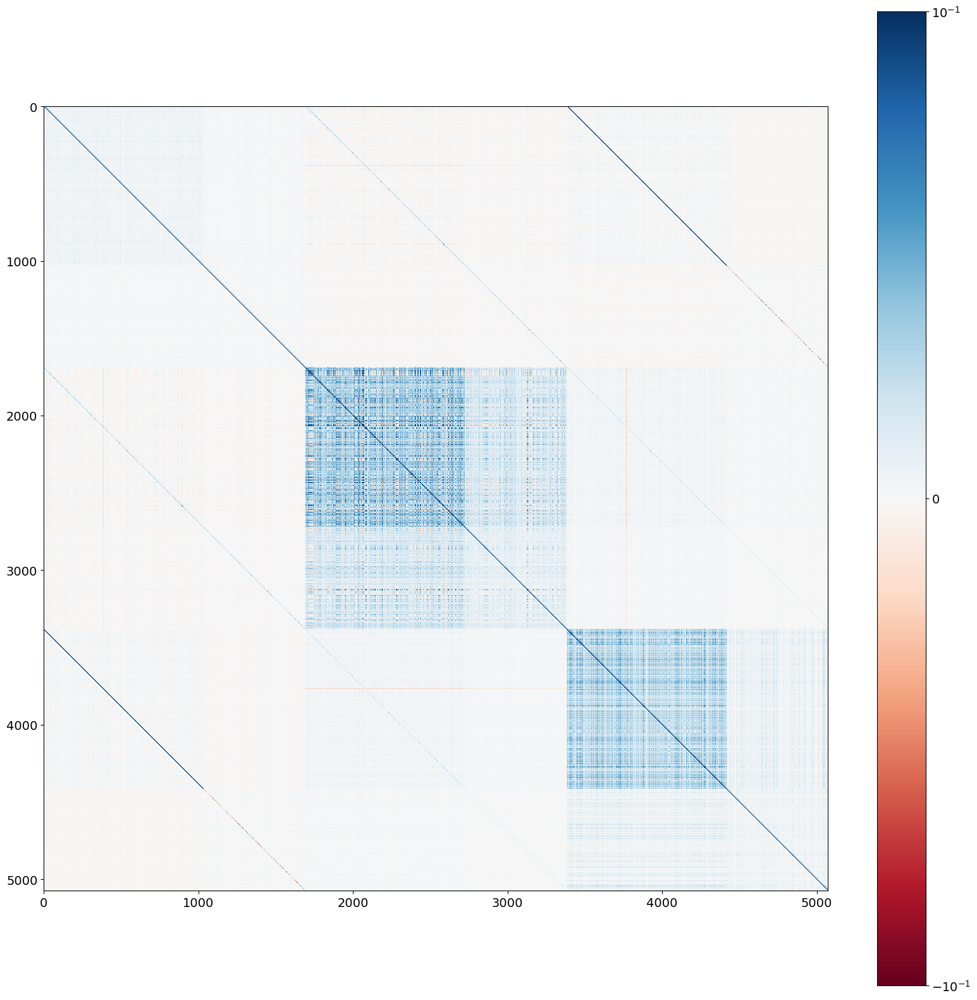

In [8]:
plt.figure(figsize=(20,20))
plt.imshow(corr_mb, norm='symlog', cmap='RdBu', vmin=-.1, vmax=.1)
plt.colorbar()

In [9]:
perm = jnp.argsort(trainer.tds.sn_data.z)
cplt_perm = jnp.hstack([*[perm+k*n for k in range(3)]])

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(corr_mb[cplt_perm][:, cplt_perm], norm='symlog', cmap='RdBu', vmin=-.1, vmax=.1)
plt.colorbar()

In [29]:
lc_ztf = pandas.read_csv("data/pets_uchuu/Results/mock_lc.csv", index_col=0).reset_index(drop=True)
lc_snls = pandas.read_csv("data/pets_snls/Results/mock_lc.csv", index_col=0)
lc_snls.reset_index(inplace=True, drop=True)
lc_snls.name += 10000
lc_snls.sn += 10000
lc_snls.lc += 10000
lc_tot = pandas.concat([lc_ztf, lc_snls])

data_ztf = pandas.read_csv("data/pets_uchuu/Results/mock_sne.csv", index_col=0).reset_index(drop=True)
data_snls = pandas.read_csv("data/pets_snls/Results/mock_sne.csv")
data_snls.index += 10000
data_snls.name += 10000
data_snls.sn += 10000
data_snls.survey='SNLS'
data_tot = pandas.concat([data_ztf, data_snls])

spectra_ztf = pandas.read_csv('data/Mock_Uchuu_sp_2.csv', index_col=0).reset_index(drop=True)
spectra_snls = pandas.read_csv('data/Mock_snls_sp_2.csv', index_col=0).reset_index(drop=True)
spectra_snls.spec += 10000
spectra_snls.sn += 10000
spectra_tot = pandas.concat([spectra_ztf, spectra_snls])

with open("outdir/SN_Uchuu.pkl", "rb") as file:
    data_ztf_truth = pickle.load(file).rename(columns={'t0':'tmax'})
    data_ztf_truth['sn'] = data_ztf_truth.index

with open("outdir/dataset_snls.pkl", "rb") as file:
    data_snls_truth = pickle.load(file).rename(columns={'t0':'tmax'})
    data_snls_truth['sn'] = data_snls_truth.index
    data_snls_truth.index += 10000
    data_snls_truth.sn += 10000
    data_snls_truth.survey='SNLS'

data_tot_truth = pandas.concat([data_ztf_truth, data_snls_truth])
float32_cols = list(data_tot_truth.select_dtypes(include='float32'))
data_tot_truth[float32_cols] = data_tot_truth[float32_cols].astype('float64')

data_tot_truth = data_tot_truth[[(sn in data_nacl.sn.values) for sn in data_tot_truth.sn]].reset_index()

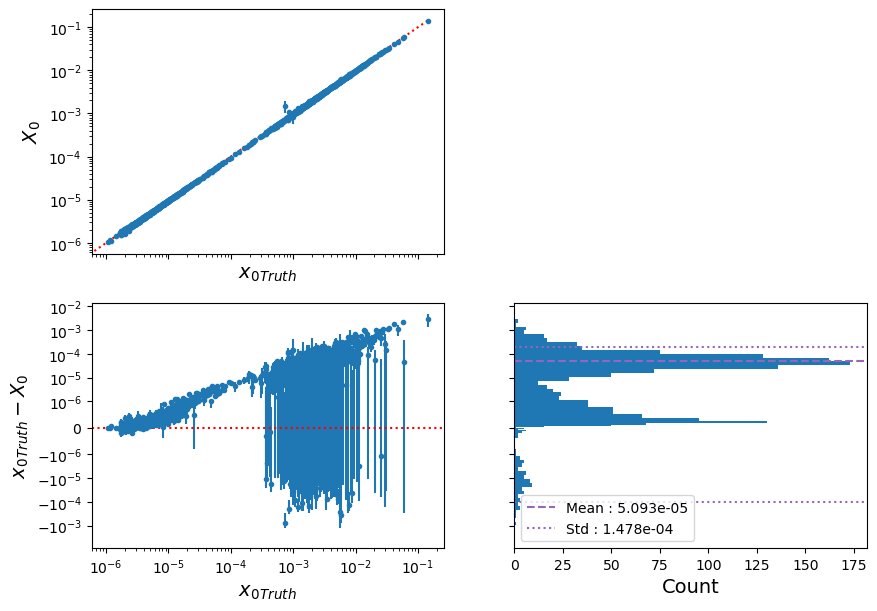

In [30]:
plot_res(data_nacl, data_tot_truth, "x0", "$X_0$", log=True, linthresh=1e-6)
plt.savefig("../figures/Rapports/nacl_x0.png")

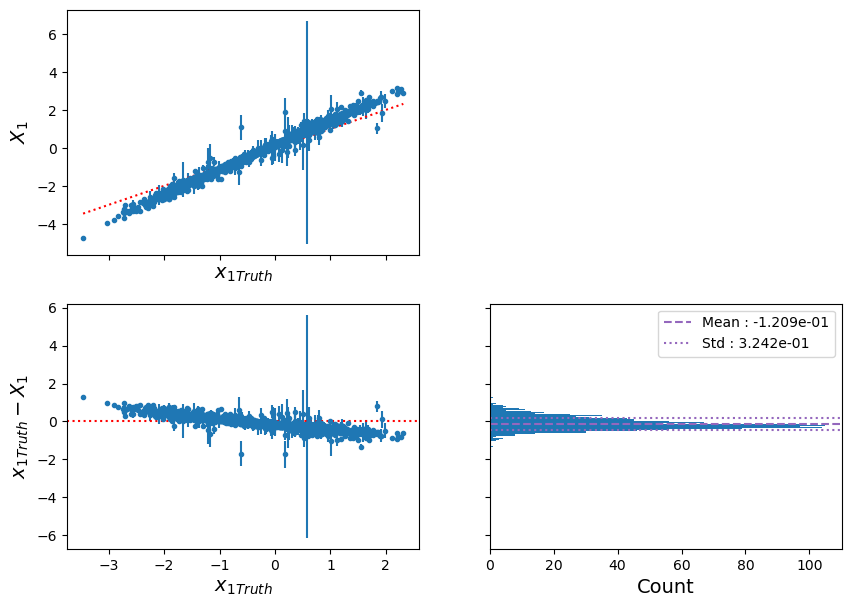

In [31]:
plot_res(data_nacl, data_tot_truth, "x1", "$X_1$")
plt.savefig("../figures/Rapports/nacl_x1.png")

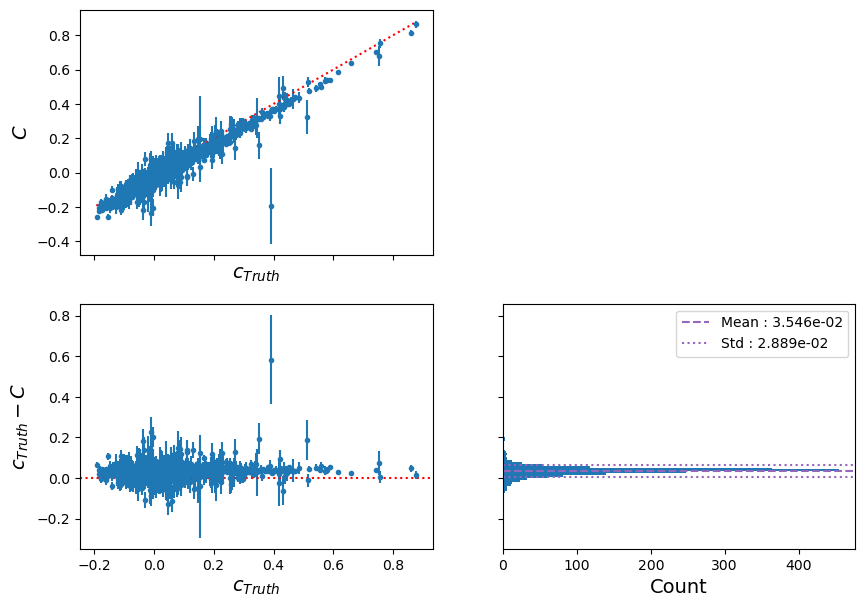

In [32]:
plot_res(data_nacl, data_tot_truth, "c", "$C$")
plt.savefig("../figures/Rapports/nacl_c.png")

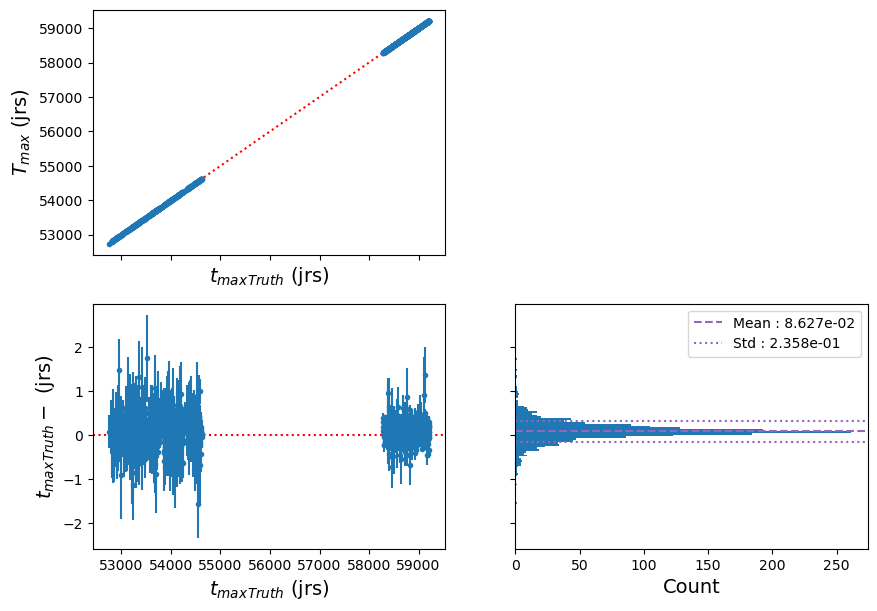

In [33]:
plot_res(data_nacl, data_tot_truth, "tmax", "$T_{max}$", unit='jrs')
plt.savefig("../figures/Rapports/nacl_tmax.png")

In [34]:
data_nacl["mu"] = data_nacl['Mb'] - alpha * data_nacl["x1"] - beta * data_nacl["c"]
data_nacl["err_mu"] = np.sqrt(data_nacl["cov_Mb"] + np.abs(alpha)**2 * data_nacl["cov_x1"] + np.abs(beta)**2 * data_nacl["cov_c"])

In [35]:
data_tot_truth["mu"] = data_tot_truth['magobs'] - alpha * data_tot_truth["x1"] - beta * data_tot_truth["c"]

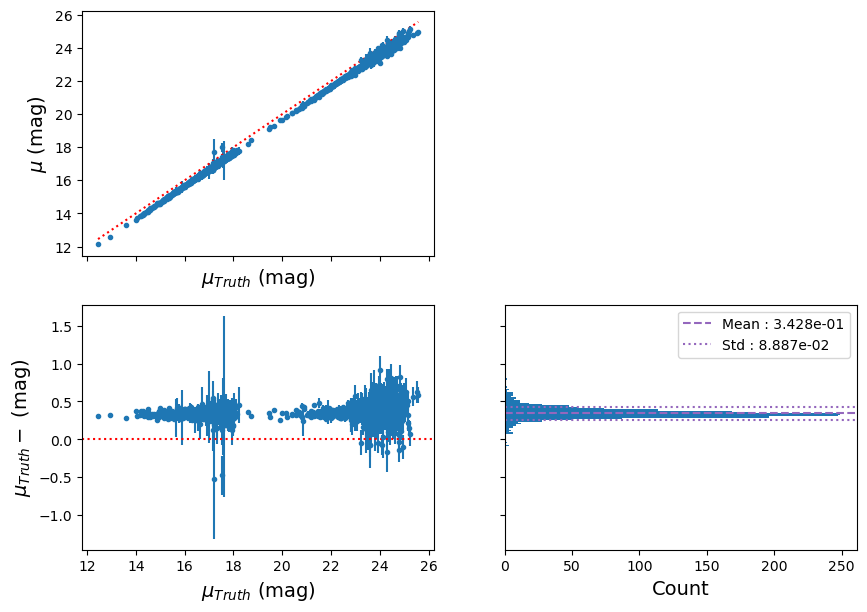

In [36]:
plot_res(data_nacl, data_tot_truth, "mu", "$\mu$", 'mag')
plt.savefig("../figures/Rapports/nacl_mu.png")

In [37]:
filt = (jnp.abs(pars_trained['c']._pars) < 0.3) & \
        (jnp.sqrt(data_nacl['cov_c'].to_numpy()) < 0.1) & \
        (jnp.abs(jnp.array(data_nacl['x1'])) + data_nacl['cov_x1'].to_numpy() < 5) & \
        (data_nacl['cov_x1'].to_numpy() < 1)
data_nacl['used_edris']=filt
sum(filt)

Array(1629, dtype=int64, weak_type=True)

In [156]:
from edris.models import FullCovariance

cov = FullCovariance(cov_mb[:n,:n], cov_mb[n:,n:], cov_mb[:n,n:])

cov_sel = cov.select(data_nacl['used_edris'].to_numpy())

n = sum(data_nacl['used_edris'])


In [157]:
cor_mm = jnp.diag(1/jnp.sqrt(jnp.diag(cov_sel.C_mm))) @ cov_sel.C_mm @ jnp.diag(1/jnp.sqrt(jnp.diag(cov_sel.C_mm)))
cor_mx = jnp.diag(1/jnp.sqrt(jnp.diag(cov_sel.C_mm))) @ cov_sel.C_mx @ jnp.diag(1/jnp.sqrt(jnp.diag(cov_sel.C_xx)))
cor_xx = jnp.diag(1/jnp.sqrt(jnp.diag(cov_sel.C_xx))) @ cov_sel.C_xx @ jnp.diag(1/jnp.sqrt(jnp.diag(cov_sel.C_xx)))

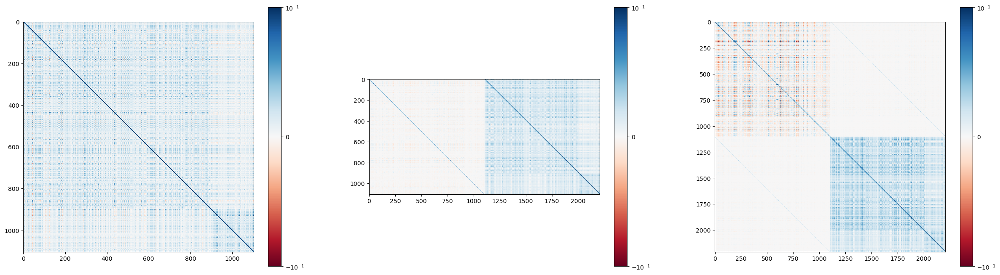

In [160]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(30, 8))
im1 = ax1.imshow(cor_mm, norm="symlog", cmap='RdBu', vmin=-.1, vmax=.1)
plt.colorbar(im1, ax=ax1)
im2 = ax2.imshow(cor_mx, norm="symlog", cmap='RdBu', vmin=-.1, vmax=.1)
plt.colorbar(im2, ax=ax2)
im3 = ax3.imshow(cor_xx, norm="symlog", cmap='RdBu', vmin=-.1, vmax=.1)
plt.colorbar(im3, ax=ax3)

## LC and spectra 

2024-10-01 08:46:10,353 INFO indexing light curves
2024-10-01 08:46:10,354 INFO indexing spectra
2024-10-01 08:46:10,354 WARNING _index_spectra: no spectra no index - pass
2024-10-01 08:46:10,355 INFO default regular grid in wavelength
2024-10-01 08:46:10,355 INFO default regular grid in phase
2024-10-01 08:46:10,358 WARNING 18 lc data points outside the model definition range
2024-10-01 08:46:10,358 WARNING 18 lc data points outside model definition range
2024-10-01 08:46:10,360 INFO default regular grid in wavelength
2024-10-01 08:46:10,360 INFO default regular grid in phase
2024-10-01 08:46:10,371 INFO initializing lightcurve eval unit


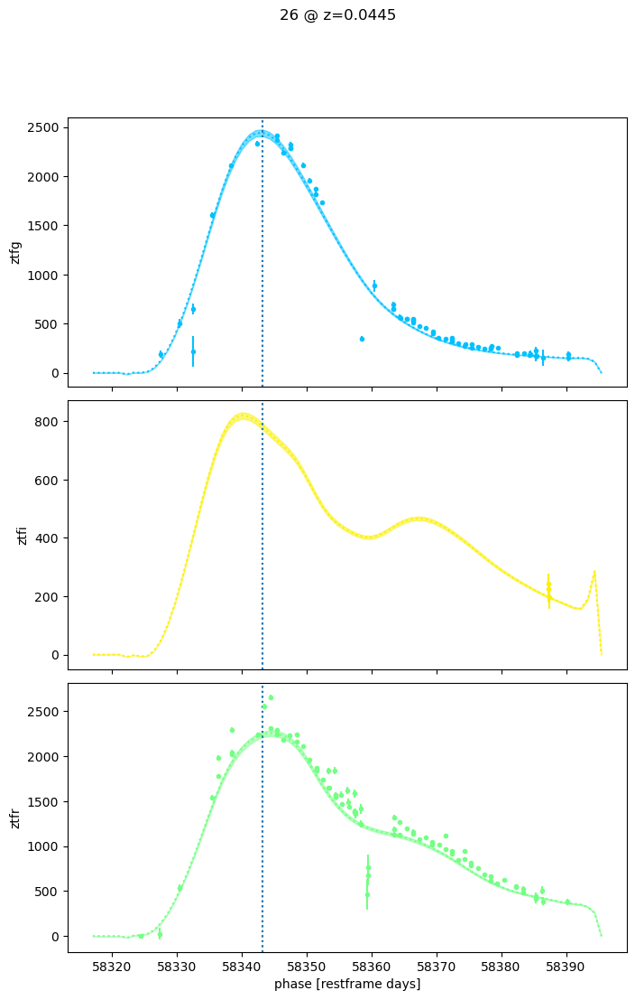

In [532]:
trainer.plot_lc(26, numfit=-1)

/tmp/ipykernel_1212745/79716679.py:18: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tmax = float(trainer.tds.sn_data.tmax[sn_idx])
/tmp/ipykernel_1212745/79716679.py:19: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  z = float(trainer.tds.sn_data.z[sn_idx])
/tmp/ipykernel_1212745/79716679.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sn_index = int(trainer.tds.sn_data.sn_index[sn_idx])
2024-10-02 01:08:53,239 INFO indexing light curves
2024-10-02 01:08:53,24

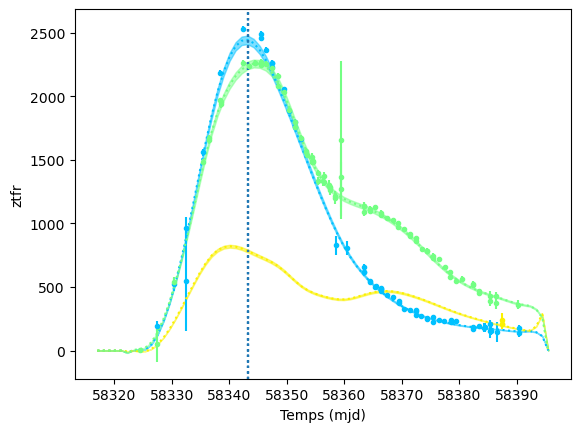

In [689]:
from nacl.train import _get_band_order, clone, ModelPlotter
from nacl.models import salt2
from bbf import SNFilterSet, SNMagSys

sn = 26

numfit=-1
pars=None
norm=1.
plot_variance=False

sel = trainer.tds.lc_data.sn == sn
bands = np.unique(trainer.tds.lc_data.band[sel]).tolist()
bands.sort(key=_get_band_order)
nrows = len(bands)

sn_idx = trainer.tds.sn_data.sn == sn
tmax = float(trainer.tds.sn_data.tmax[sn_idx])
z = float(trainer.tds.sn_data.z[sn_idx])
sn_index = int(trainer.tds.sn_data.sn_index[sn_idx])

# clone the dataset
t = clone(trainer.tds, sn)
to_plot = trainer._get_models_to_plot(numfit, pars)
m = salt2.get_model(t)
if trainer.variance_model is not None:
    vm = trainer.variance_model.__class__(m)
else:
    vm = None
plotters = [ModelPlotter(m, sn_index, tp.ll.pars, variance_model=vm) \
            for tp in to_plot]

# plots
fig, ax = plt.subplots()
for i,b in enumerate(bands):
    idx = sel & (trainer.tds.lc_data.band == b)
    wl = trainer.tds.lc_data.wavelength[idx].mean()
    color = plt.cm.jet(int((wl-2000)/(11000.-2000.) * 256))
    xx = trainer.tds.lc_data.mjd[idx]

    ax.errorbar(xx, trainer.tds.lc_data.flux[idx] * trainer.tds.lc_data.zp_scale[idx]/trainer.tds.lc_data.zp_scale[idx].mean(),
                 yerr=trainer.tds.lc_data.fluxerr[idx] * trainer.tds.lc_data.zp_scale[idx]/trainer.tds.lc_data.zp_scale[idx].mean(),
                 ls='', marker='.', color=color)

    ax.axvline(tmax, ls=':')

    for p in plotters:
        p.plot(b, ax=ax,
               color=color,
               ylabel=b)
    ax.set_xlabel('Temps (mjd)')
plt.savefig('../figures/Rapports/nacl_lc.png')

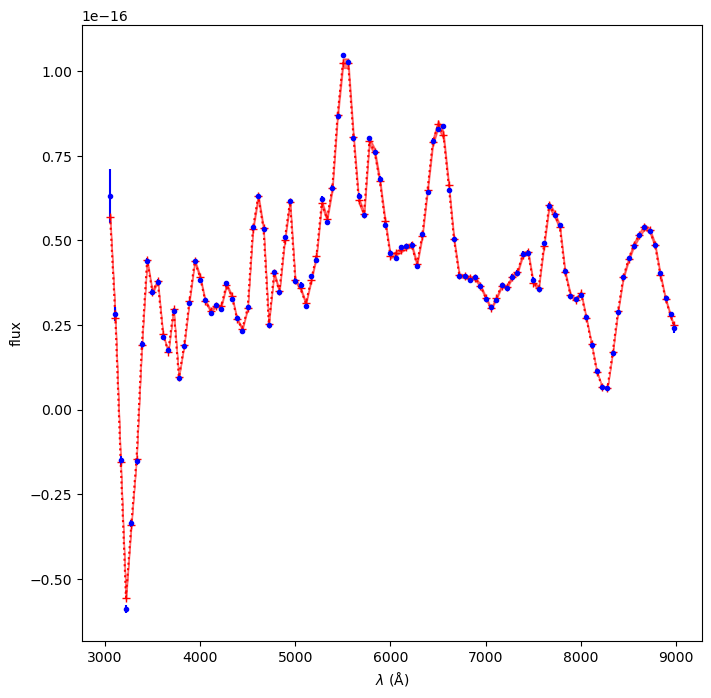

In [654]:
trainer.plot_spec(23, numfit=-1)
plt.gca().set_title("")
plt.gca().set_xlabel("$\lambda$ (Å)")
plt.savefig("../figures/Rapports/nacl_spec.png")

## EDRIS on NaCl

In [157]:
from edris.tools import linear_interpolation
from astropy.constants import c

def integrand(Omega_m, Omega_r, Omega_l, u):
    return 1 / jnp.sqrt(Omega_m + Omega_r * u ** (-2) + Omega_l * u**6)


def dist(
    z,
    Omega_m=Planck15.Om0,
    Omega_r=5e-5,
    Omega_l=Planck15.Ode0,
    H0=Planck15.H0.value,
    nstep=10000,
    **kwargs
):
    dh = c.value * 1e-3 / H0
    u = 1 / jnp.sqrt(1 + z)
    umin = 0.02
    step = (1 - umin) / nstep
    _u = jnp.arange(umin + 0.5 * step, 1, step)
    csum = jnp.cumsum(integrand(Omega_m, Omega_r, Omega_l, _u[-1::-1]))[-1::-1]
    R = linear_interpolation(u, csum, _u - 0.5 * step) * 2 * step * dh
    return R

def cosmo(params, exp):
    return 5.0 * jnp.log10(abs(exp["z"] + 1.0) * dist(exp["z"], **params)) + params.get("M0", 25-19.3)

In [158]:
with open("outdir/edris_nacl_uchuu.pkl", "rb") as file:
    exp = pickle.load(file)
    obs = pickle.load(file)
    cov = pickle.load(file)
    res = pickle.load(file)
    hess = pickle.load(file)

x0 = {
    # "mu_bins": jnp.array(mag_Planck15(exp['z_bins'])),
    # "Omega_m": jnp.array([Planck15.Om0]),
    # "Omega_r": jnp.array([5e-5]),
    "Omega_l": jnp.array([Planck15.Ode0]),
    "H0": jnp.array([Planck15.H0.value]),
    "coef": jnp.array([-0.14, 3.15]),
    "variables": jnp.array(obs.variables.reshape((2, -1))),
    # "sigma_int":jnp.array([0.1]),
    # "M0":jnp.array([25 - 19.3]),
}


n = {k1:hess[k1][k1].shape[1] for k1 in hess.keys()}
n["variables"]*=n["coef"]
flatten_hess = jnp.vstack([np.hstack([hess[k1][k2].reshape(n[k1], n[k2]) for k2 in hess.keys()]) for k1 in hess.keys()])
cov_res = jnp.linalg.inv(0.5 * flatten_hess)

In [159]:
filt = np.array([np.any(np.isclose(data_tot[data_tot.survey=='ZTF'].zhel, float(z)))  for z in exp["z"]])

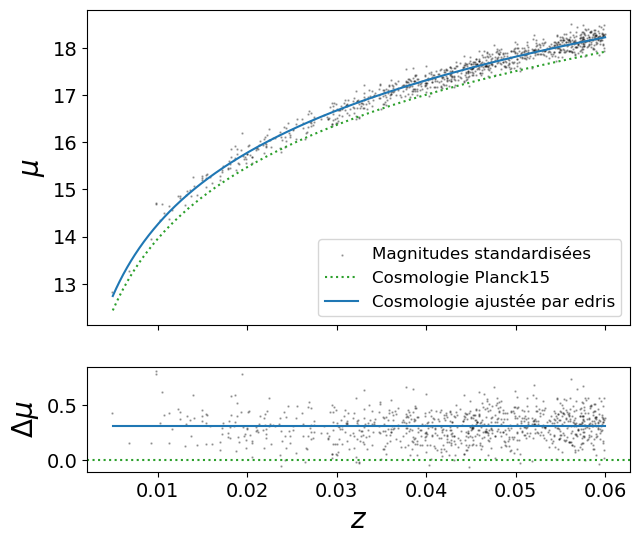

In [160]:
std_mag = obs.mag - jnp.matmul(res["coef"], res["variables"])

fig, (ax1, ax2) = plt.subplots(
    nrows=2, sharex="col", figsize=(7, 6), gridspec_kw={"height_ratios": [3, 1]}
)

ax1.scatter(
    exp["z"][filt], std_mag[filt], s=0.5, alpha=0.3, color="k",
    # label="Magnitudes standardisées\n"+rf'$\alpha =${res["coef"][0]:.3f} $\pm${np.sqrt(cov_res[2][2]):.3f}; $\beta =$ {res["coef"][1]:.3f} $\pm${np.sqrt(cov_res[3][3]):.3f}'
    label="Magnitudes standardisées"
)
ax1.plot(
    np.linspace(5e-3, 0.06, 1000),
    cosmo(x0, {'z':np.linspace(5e-3, 0.06, 1000)}),
    color="tab:green",
    linestyle=":",
    label="Cosmologie Planck15",
)

ax2.scatter(exp["z"][filt], std_mag[filt] - cosmo(x0, exp)[filt], color="k", s=0.5, alpha=0.3)

if "mu_bins" in res.keys():
    ax1.errorbar(
        exp["z_bins"][filt],
        res["mu_bins"][filt],
        yerr=jnp.sqrt(jnp.diag(cov_res[2 : 2 + n_bins, 2 : 2 + n_bins]))[filt],
        color="tab:blue",
        label="edris",
    )
    ax2.errorbar(
        exp["z_bins"][filt],
        res["mu_bins"][filt] - cosmo(x0, {"z" : exp["z_bins"]})[filt],
        yerr=jnp.sqrt(jnp.diag(cov_res[2 : 2 + n_bins, 2 : 2 + n_bins]))[filt],
        color="tab:blue",
    )
else:
    ax1.plot(
        jnp.linspace(5e-3, 0.06, 1000),
        cosmo(res, {"z": jnp.linspace(5e-3, 0.06, 1000)}),
        color="tab:blue",
        # label="Cosmologie ajustée par edris\n"+rf'$H_0 =${res["H0"][0]:.1f} $\pm${np.sqrt(cov_res[0][0]):.1f}; $\Omega_\Lambda =$ {res["Omega_l"][0]:.3f} $\pm${np.sqrt(cov_res[1][1]):.3f}',
        label="Cosmologie ajustée par edris",
    )
    ax2.plot(
        jnp.linspace(5e-3, 0.06, 1000),
        cosmo(res, {"z": jnp.linspace(5e-3, 0.06, 1000)}) - cosmo(x0, {"z":jnp.linspace(5e-3, 0.06, 1000)}),
        color="tab:blue",
    )


ax1.legend()
ax1.set_ylabel(r"$\mu$")

lims = ax2.get_xlim()
ax2.hlines(0.0, xmin=lims[0], xmax=lims[1], color="tab:green", linestyle=":")
ax2.set_xlim(*lims)
ax2.set_ylabel(r"$\Delta\mu$")
ax2.set_xlabel(r"$z$")

# fig.suptitle(r"Modèle $\Lambda$CDM ajusté par Edris à partir de NaCl")
plt.savefig("../figures/Rapports/nacl_cosmo")

In [523]:
potential_keys = ['H0', 'M0', 'Omega_m', 'Omega_r', 'Omega_l', 'coef', 'sigma_int']
latex_keys = {'H0': '$H_0$',
  'M0': '$M_0$',
  'Omega_m': '$\\Omega_m$',
  'Omega_r': '$\\Omega_r$',
  'Omega_l': '$\\Omega_l$',
  'coef': ['$\\alpha$', '$\\beta$'],
  'sigma_int': '$\\sigma_{int}$'}

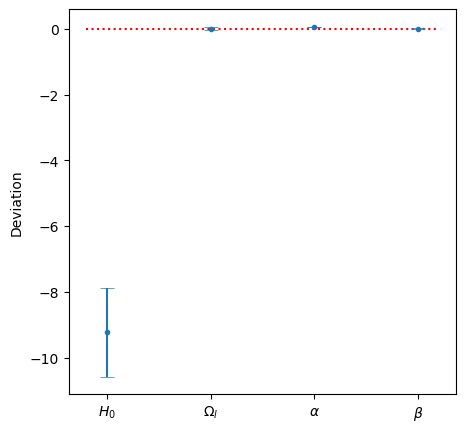

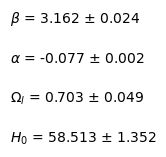

In [525]:
fig, ax = plt.subplots(figsize=(5,5))
keys = np.array(list(res.keys()))[[p in potential_keys for p in res.keys()]]
labels, values, diffs = [], [], []
for k in keys:
    labels += latex_keys[k] if isinstance(latex_keys[k], list) else [latex_keys[k]]
    values += list(res[k])
    diffs +=  list(res[k] - x0[k])
n_pars = len(keys)
ax.hlines(0, -1, 5*n_pars+1, color='r', linestyle=':')
ax.set_xticks(5*np.arange(n_pars+1), labels)
ax.set_ylabel('Deviation')
plt.errorbar(5*np.arange(n_pars+1), diffs,
             yerr= jnp.sqrt(jnp.diag(cov_res)[:n_pars+1]),
             linestyle='',
             marker='.',
             capsize=5,
             capthick=.5)
# plt.savefig('../figures/Uchuu_final_params.png')
fig, ax = plt.subplots(figsize=(1,1))
ax.axis("off")
for i, pos in enumerate(np.arange(n_pars+1)*.4):
    fig.text(0, pos, labels[i] + f" = {values[i]:.3f} $\\pm$ {jnp.sqrt(jnp.diag(cov_res)[i]):.3f}")

plt.savefig('../figures/Rapports/nacl_cosmo_params.png')

# Vpec


In [3]:
plt.rc('axes', labelsize=14)    # fontsize of the labels
plt.rc('xtick', labelsize=10)    # fontsize of the tick labels
plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
plt.rc('legend', fontsize=10)    # legend fontsize

In [8]:
from edris.tools import linear_interpolation
from astropy.constants import c

def integrand(Omega_m, u):
    return 1 / jnp.sqrt(Omega_m + (1-Omega_m) * u**6)


def dist(
    z,
    Omega_m=Planck15.Om0,
    H0=Planck15.H0.value,
    nstep=10000,
    **kwargs
):
    dh = c.value * 1e-3 / H0
    u = 1 / jnp.sqrt(1 + z)
    umin = 0.02
    step = (1 - umin) / nstep
    _u = jnp.arange(umin + 0.5 * step, 1, step)
    csum = jnp.cumsum(integrand(Omega_m, _u[-1::-1]))[-1::-1]
    R = linear_interpolation(u, csum, _u - 0.5 * step) * 2 * step * dh
    return R

def cosmo(params, exp):
    return 5.0 * jnp.log10(abs(exp["z"] + 1.0) * dist(exp["z"], **params)) + params.get("M0", 25-19.3)

x0 = {
    # "mu_bins": jnp.array(mag_Planck15(exp['z_bins'])),
    "Omega_m": jnp.array([Planck15.Om0]),
    # "Omega_r": jnp.array([5e-5]),
    # "Omega_l": jnp.array([Planck15.Ode0]),
    "H0": jnp.array([Planck15.H0.value]),
    "coef": jnp.array([-0.14, 3.15]),
    # "sigma_int":jnp.array([0.1]),
    # "M0":jnp.array([25 - 19.3]),
}


In [10]:
with open("outdir/SN_Uchuu.pkl", "rb") as f:
    data_ztf = pickle.load(f)
    lc_ztf = pickle.load(f)
    res_sn_ztf = pickle.load(f)
    meta_ztf = pickle.load(f)

(array([1.34779882e+04, 6.83850020e+00]),
 array([-1.29209619e+04, -6.02528016e+00]),
 array([47.11795723,  1.46779248]),
 array([41.69419727,  1.29883416]))

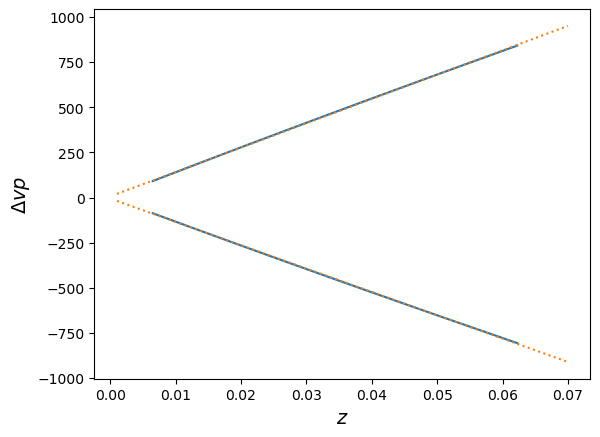

In [11]:
mag_to_z = jnp.vectorize(interp1d(mag_Planck15(np.linspace(1e-3, 0.1, 10000)), np.linspace(1e-3, 0.1, 10000)), signature='(k)->(k)')

data_ztf["calc_z_cosmo"] = mag_to_z(data_ztf["magobs"] + 0.14 * data_ztf["x1"] - 3.15 * data_ztf["c"])

def aff(x, a, b=0):
    return a*x+b
popt_up, pcov_up = curve_fit(aff,
                             mag_to_z(np.linspace(13, 18, 11)),
                             (mag_to_z(np.linspace(13, 18, 11) + 0.1) - mag_to_z(np.linspace(13, 18, 11))) * c*1e-3)

popt_do, pcov_do = curve_fit(aff,
                             mag_to_z(np.linspace(13, 18, 11)),
                             (mag_to_z(np.linspace(13, 18, 11) - 0.1) - mag_to_z(np.linspace(13, 18, 11))) * c*1e-3)



plt.plot(mag_to_z(np.linspace(13, 18, 11)),
         (mag_to_z(np.linspace(13, 18, 11) + 0.1) - mag_to_z(np.linspace(13, 18, 11))) * c*1e-3,
         color="tab:blue")
plt.plot(mag_to_z(np.linspace(13, 18, 11)),
         (mag_to_z(np.linspace(13, 18, 11) - 0.1) - mag_to_z(np.linspace(13, 18, 11))) * c*1e-3,
         color="tab:blue")
plt.plot(np.linspace(0.001, 0.07),
         aff(np.linspace(0.001, 0.07), *popt_up),
         linestyle=":",
         color="tab:orange")
plt.plot(np.linspace(0.001, 0.07),
         aff(np.linspace(0.001, 0.07), *popt_do),
         linestyle=":",
         color="tab:orange")

plt.xlabel("$z$")
plt.ylabel(r"$\Delta vp$")

popt_up, popt_do, np.sqrt(np.diag(pcov_up)), np.sqrt(np.diag(pcov_do))

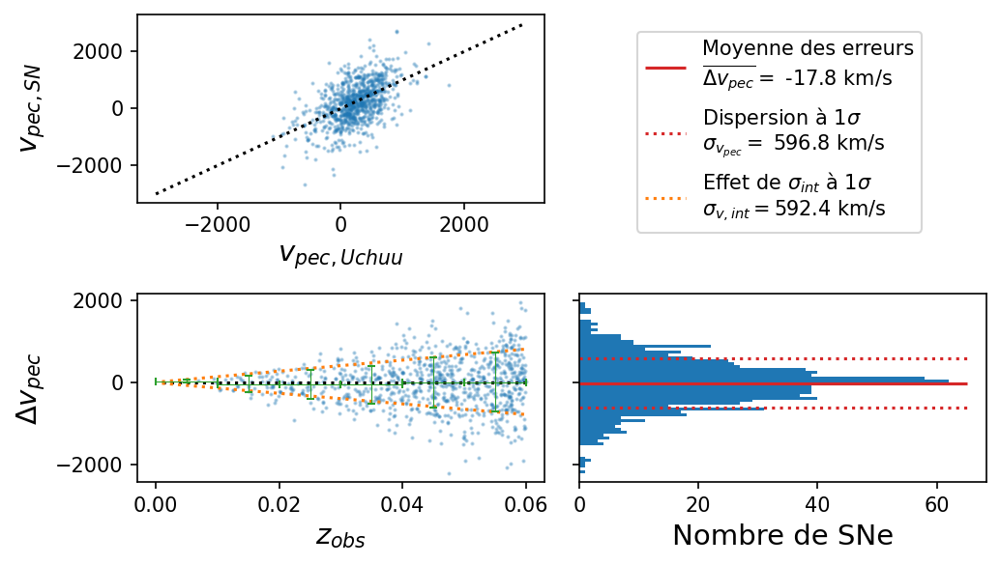

In [12]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(
    nrows=2, ncols=2, sharey="row", figsize=(7, 4), dpi=150
)
ax1.scatter(
    (data_ztf[data_ztf.valid].z - data_ztf[data_ztf.valid].z_cosmo) * c*1e-3,
    (data_ztf[data_ztf.valid].z - data_ztf[data_ztf.valid].calc_z_cosmo) * c*1e-3,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax1.plot(
    np.linspace(-0.01, 0.01, 1000) * c*1e-3,
    np.linspace(-0.01, 0.01, 1000) * c*1e-3,
    ":k",
)
ax1.set_ylabel(r"$v_{pec,SN}$")
ax1.set_xlabel(r"$v_{pec,Uchuu}$")
# fig.suptitle(r"Is the $z_{cosmo}$ reconstructed by edris the same as the uchuu one ?")

ax2.axis("off")


delta_pv = (
    data_ztf[data_ztf.valid].z_cosmo - data_ztf[data_ztf.valid].calc_z_cosmo
) * c*1e-3

ax3.scatter(
    data_ztf[data_ztf.valid].z,
    delta_pv,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax3.plot(np.linspace(1e-3, 0.06, 1000), np.zeros(1000), ":k")

ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_up), linestyle=":", color="tab:orange",
         label=r'Effet de $\sigma_{int}$ à $1\sigma$' + '\n' +'$\sigma_{v, int}=$' + \
         f'{(np.mean(aff(data_ztf["z"], *popt_up)) - np.mean(aff(data_ztf["z"], *popt_do)))/2:.1f} km/s')
ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_do), linestyle=":", color="tab:orange")
ax3.errorbar(np.linspace(0.00, 0.05, 6)+0.005,
             [delta_pv[(data_ztf['z'] > z_min) & (data_ztf['z'] < z_min + 0.01)].mean() for z_min in np.linspace(0.00, 0.05, 6)],
             yerr=[delta_pv[(data_ztf['z'] > z_min) & (data_ztf['z'] < z_min + 0.01)].std() for z_min in np.linspace(0.00, 0.05, 6)],
             xerr=0.005,
             linestyle='',
             color='tab:green',
             linewidth=0.5,
             capsize=2)

ax3.set_xlabel(r"$z_{obs}$")
ax3.set_ylabel(r"$\Delta v_{pec}$")

ax4.hist(delta_pv, bins=60, orientation="horizontal", color="tab:blue")
m = ax4.get_xlim()[1]
ax4.hlines(
    [delta_pv.mean() - delta_pv.std(), delta_pv.mean() + delta_pv.std()],
    xmin=0,
    xmax=m,
    color="tab:red",
    linestyle=":",
    label=r"Dispersion à 1$\sigma$"+"\n"+r"$\sigma_{v_{pec}} =$" + f" {delta_pv.std():.1f} km/s",
)
ax4.hlines(
    delta_pv.mean(),
    xmin=0,
    xmax=m,
    color="tab:red",
    label="Moyenne des erreurs\n"+r"$\overline{\Delta v_{pec}} =$" + f" {delta_pv.mean():.1f} km/s",
)
ax4.set_xlabel(r"Nombre de SNe")

fig.legend(loc=1, bbox_to_anchor=(0.425, 0.5, 0.5, 0.45), reverse=True)
plt.tight_layout()
plt.savefig('../figures/Rapports/vp_draw.png')


In [11]:
lc_ztf = pandas.read_csv("data/pets_uchuu/Results/mock_lc.csv", index_col=0).reset_index(drop=True)
lc_snls = pandas.read_csv("data/pets_snls/Results/mock_lc.csv", index_col=0)
lc_snls.sn += 10000
lc_snls.lc += 10000
lc_tot = pandas.concat([lc_ztf,
                        lc_snls
                       ])
lc_tot.valid = lc_tot.valid.astype(bool)

data_ztf = pandas.read_csv("data/pets_uchuu/Results/mock_sne.csv", index_col=0).reset_index(drop=True)
data_snls = pandas.read_csv("data/pets_snls/Results/mock_sne.csv")
data_snls.index += 10000
data_snls.sn += 10000
data_snls.survey='SNLS'
data_tot = pandas.concat([data_ztf,
                          data_snls
                         ])
data_tot.valid = data_tot.valid.astype(bool)

spectra_ztf = pandas.read_csv('data/Mock_Uchuu_sp_2.csv', index_col=0).reset_index(drop=True)
spectra_snls = pandas.read_csv('data/Mock_snls_sp.csv', index_col=0).reset_index(drop=True)
spectra_snls.spec += 10000
spectra_snls.sn += 10000
spectra_tot = pandas.concat([spectra_ztf,
                             spectra_snls,
                            ])
spectra_tot.valid = spectra_tot.valid.astype(bool)

In [13]:
with open('outdir/SN_Uchuu_salt_res.pkl', 'rb') as file:
    data_tot = pickle.load(file)
    res = pickle.load(file)
    cov_res = pickle.load(file)

mag_to_z_cosmo = jnp.vectorize(interp1d(cosmo(res, {"z": jnp.linspace(5e-3, 0.2, 10000)}), np.linspace(5e-3, 0.2,10000)), signature='(k)->(k)')

def aff(x, a, b=0):
    return a*x+b
popt_up, pcov_up = curve_fit(aff,
                             mag_to_z_cosmo(np.linspace(13, 18, 11)),
                             (mag_to_z_cosmo(np.linspace(13, 18, 11) + 0.1) - mag_to_z_cosmo(np.linspace(13, 18, 11))) * c*1e-3)

popt_do, pcov_do = curve_fit(aff,
                             mag_to_z_cosmo(np.linspace(13, 18, 11)),
                             (mag_to_z_cosmo(np.linspace(13, 18, 11) - 0.1) - mag_to_z_cosmo(np.linspace(13, 18, 11))) * c*1e-3)



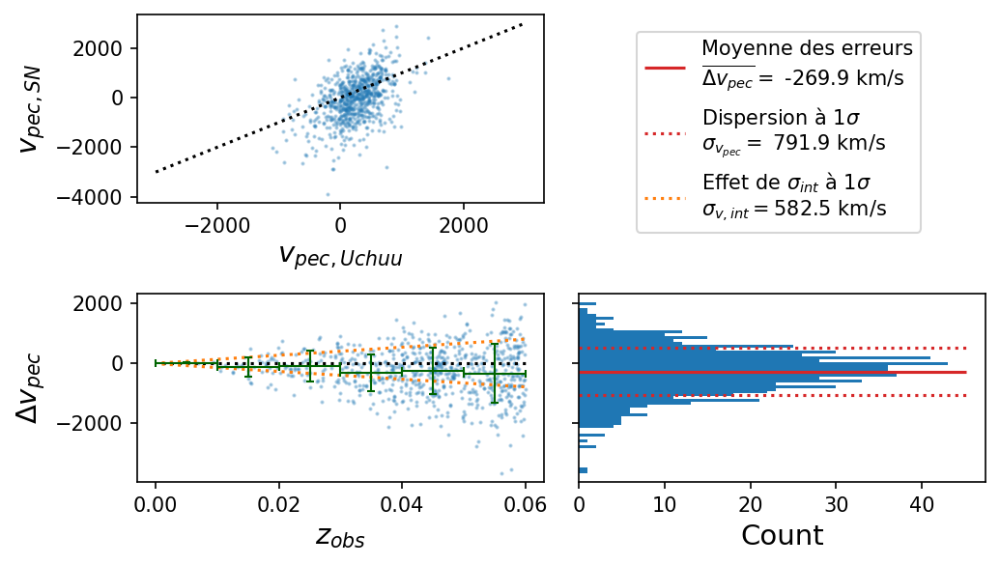

In [14]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(
    nrows=2, ncols=2, sharey="row", figsize=(7, 4), dpi=150
)
ax1.scatter(
    (data_tot[data_tot.ztf_vpec].z - data_tot[data_tot.ztf_vpec].z_cosmo) * c*1e-3,
    (data_tot[data_tot.ztf_vpec].z - data_tot[data_tot.ztf_vpec].calc_z_cosmo) * c*1e-3,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax1.plot(
    np.linspace(-0.01, 0.01, 1000) * c*1e-3,
    np.linspace(-0.01, 0.01, 1000) * c*1e-3,
    ":k",
)
ax1.set_ylabel(r"$v_{pec,SN}$")
ax1.set_xlabel(r"$v_{pec,Uchuu}$")
# fig.suptitle(r"Is the $z_{cosmo}$ reconstructed by edris the same as the uchuu one ?")

ax2.axis("off")

delta_pv = (
     data_tot[data_tot.ztf_vpec].z_cosmo - data_tot[data_tot.ztf_vpec].calc_z_cosmo
) * c*1e-3

ax3.scatter(
    data_tot[data_tot.ztf_vpec].z,
    delta_pv,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax3.plot(np.linspace(1e-3, 0.06, 1000), np.zeros(1000), ":k")
ax3.set_xlabel(r"$z_{obs}$")
ax3.set_ylabel(r"$\Delta v_{pec}$")

ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_up), linestyle=":", color="tab:orange",
         label=r'Effet de $\sigma_{int}$ à $1\sigma$' + '\n' +'$\sigma_{v, int}=$' + \
         f'{(np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_up)) - np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_do)))/2:.1f} km/s')
ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_do), linestyle=":", color="tab:orange")
ax3.errorbar(np.linspace(0.00, 0.05, 6)+0.005,
             [delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].mean() for z_min in np.linspace(0.00, 0.05, 6)],
             yerr=[delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].std() for z_min in np.linspace(0.00, 0.05, 6)],
             xerr=0.005,
             linestyle='',
             color='darkgreen',
             linewidth=1,
             capsize=2)

ax4.hist(delta_pv, bins=60, orientation="horizontal", color="tab:blue")
m = ax4.get_xlim()[1]
ax4.hlines(
    [delta_pv.mean() - delta_pv.std(), delta_pv.mean() + delta_pv.std()],
    xmin=0,
    xmax=m,
    color="tab:red",
    linestyle=":",
    label=r"Dispersion à 1$\sigma$"+"\n"+r"$\sigma_{v_{pec}} =$" + f" {delta_pv.std():.1f} km/s",
)
ax4.hlines(
    delta_pv.mean(),
    xmin=0,
    xmax=m,
    color="tab:red",
    label="Moyenne des erreurs\n"+r"$\overline{\Delta v_{pec}} =$" + f" {delta_pv.mean():.1f} km/s",
)

ax4.set_xlabel(r"Count")

fig.legend(loc=1, bbox_to_anchor=(0.425, 0.5, 0.5, 0.45), reverse=True)
plt.tight_layout()
plt.savefig('../figures/Rapports/vp_salt')

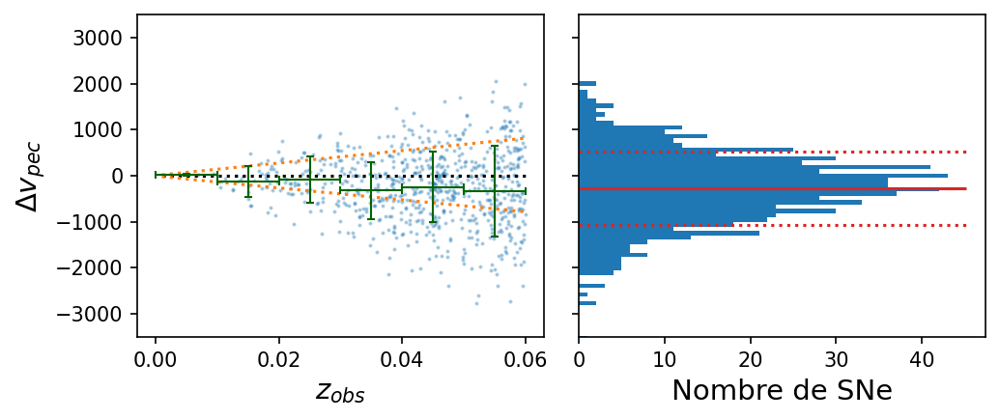

In [15]:
fig, (ax3, ax4) = plt.subplots(
    ncols=2, sharey="row", figsize=(7, 3), dpi=150
)
delta_pv = (
     data_tot[data_tot.ztf_vpec].z_cosmo - data_tot[data_tot.ztf_vpec].calc_z_cosmo
) * c*1e-3

ax3.scatter(
    data_tot[data_tot.ztf_vpec].z,
    delta_pv,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax3.plot(np.linspace(1e-3, 0.06, 1000), np.zeros(1000), ":k")
ax3.set_xlabel(r"$z_{obs}$")
ax3.set_ylabel(r"$\Delta v_{pec}$")
ax3.set_ylim(-3500, 3500)

ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_up), linestyle=":", color="tab:orange",
         label=r'Effet de $\sigma_{int}$ à $1\sigma$' + '\n' +'$\sigma_{v, int}=$' + \
         f'{(np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_up)) - np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_do)))/2:.1f} km/s')
ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_do), linestyle=":", color="tab:orange")
ax3.errorbar(np.linspace(0.00, 0.05, 6)+0.005,
             [delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].mean() for z_min in np.linspace(0.00, 0.05, 6)],
             yerr=[delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].std() for z_min in np.linspace(0.00, 0.05, 6)],
             xerr=0.005,
             linestyle='',
             color='darkgreen',
             linewidth=1,
             capsize=2)

ax4.hist(delta_pv, bins=60, orientation="horizontal", color="tab:blue")
m = ax4.get_xlim()[1]
ax4.hlines(
    [delta_pv.mean() - delta_pv.std(), delta_pv.mean() + delta_pv.std()],
    xmin=0,
    xmax=m,
    color="tab:red",
    linestyle=":",
    label=r"Dispersion à 1$\sigma$"+"\n"+r"$\sigma_{v_{pec}} =$" + f" {delta_pv.std():.1f} km/s",
)
ax4.hlines(
    delta_pv.mean(),
    xmin=0,
    xmax=m,
    color="tab:red",
    label="Moyenne des erreurs\n"+r"$\overline{\Delta v_{pec}} =$" + f" {delta_pv.mean():.1f} km/s",
)

ax4.set_xlabel(r"Nombre de SNe")

# fig.legend(loc=1, bbox_to_anchor=(0.425, 0.5, 0.5, 0.45), reverse=True)
plt.tight_layout()
plt.savefig('../figures/Rapports/vp_salt_clean')

In [17]:
with open('outdir/SN_Uchuu_nacl_res.pkl', 'rb') as file:
    data_tot = pickle.load(file)
    res = pickle.load(file)
    cov_res = pickle.load(file)

mag_to_z_cosmo = jnp.vectorize(interp1d(cosmo(res, {"z": jnp.linspace(1e-3, 0.2, 10000)}), np.linspace(1e-3, 0.2,10000)), signature='(k)->(k)')

def aff(x, a, b=0):
    return a*x+b
popt_up, pcov_up = curve_fit(aff,
                             mag_to_z_cosmo(np.linspace(13, 18, 11)),
                             (mag_to_z_cosmo(np.linspace(13, 18, 11) + 0.1) - mag_to_z_cosmo(np.linspace(13, 18, 11))) * c*1e-3)

popt_do, pcov_do = curve_fit(aff,
                             mag_to_z_cosmo(np.linspace(13, 18, 11)),
                             (mag_to_z_cosmo(np.linspace(13, 18, 11) - 0.1) - mag_to_z_cosmo(np.linspace(13, 18, 11))) * c*1e-3)



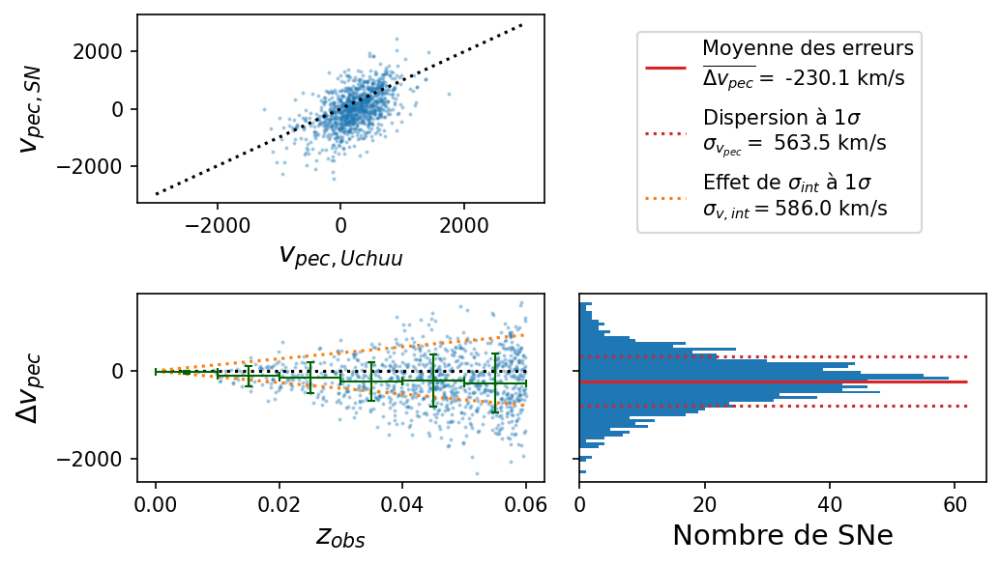

In [18]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(
    nrows=2, ncols=2, sharey="row", figsize=(7, 4), dpi=150
)
ax1.scatter(
    (data_tot[data_tot.ztf_vpec].z - data_tot[data_tot.ztf_vpec].z_cosmo) * c*1e-3,
    (data_tot[data_tot.ztf_vpec].z - data_tot[data_tot.ztf_vpec].calc_z_cosmo) * c*1e-3,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax1.plot(
    np.linspace(-0.01, 0.01, 1000) * c*1e-3,
    np.linspace(-0.01, 0.01, 1000) * c*1e-3,
    ":k",
)
ax1.set_ylabel(r"$v_{pec,SN}$")
ax1.set_xlabel(r"$v_{pec,Uchuu}$")
# fig.suptitle(r"Is the $z_{cosmo}$ reconstructed by edris the same as the uchuu one ?")

ax2.axis("off")

delta_pv = (
    data_tot[data_tot.ztf_vpec].z_cosmo - data_tot[data_tot.ztf_vpec].calc_z_cosmo
) * c*1e-3

ax3.scatter(
    data_tot[data_tot.ztf_vpec].z,
    delta_pv,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax3.plot(np.linspace(1e-3, 0.06, 1000), np.zeros(1000), ":k")
ax3.set_xlabel(r"$z_{obs}$")
ax3.set_ylabel(r"$\Delta v_{pec}$")

ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_up), linestyle=":", color="tab:orange",
         label=r'Effet de $\sigma_{int}$ à $1\sigma$' + '\n' +'$\sigma_{v, int}=$' + \
         f'{(np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_up)) - np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_do)))/2:.1f} km/s')
ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_do), linestyle=":", color="tab:orange")

ax3.errorbar(np.linspace(0.00, 0.05, 6)+0.005,
             [delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].mean() for z_min in np.linspace(0.00, 0.05, 6)],
             yerr=[delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].std() for z_min in np.linspace(0.00, 0.05, 6)],
             xerr=0.005,
             linestyle='',
             color='darkgreen',
             linewidth=1,
             capsize=2)

ax4.hist(delta_pv, bins=60, orientation="horizontal", color="tab:blue")
m = ax4.get_xlim()[1]
ax4.hlines(
    [delta_pv.mean() - delta_pv.std(), delta_pv.mean() + delta_pv.std()],
    xmin=0,
    xmax=m,
    color="tab:red",
    linestyle=":",
    label=r"Dispersion à 1$\sigma$"+"\n"+r"$\sigma_{v_{pec}} =$" + f" {delta_pv.std():.1f} km/s",
)
ax4.hlines(
    delta_pv.mean(),
    xmin=0,
    xmax=m,
    color="tab:red",
    label="Moyenne des erreurs\n"+r"$\overline{\Delta v_{pec}} =$" + f" {delta_pv.mean():.1f} km/s",
)

ax4.set_xlabel(r"Nombre de SNe")

fig.legend(loc=1, bbox_to_anchor=(0.425, 0.5, 0.5, 0.45), reverse=True)
plt.tight_layout()
plt.savefig('../figures/Rapports/vp_nacl')

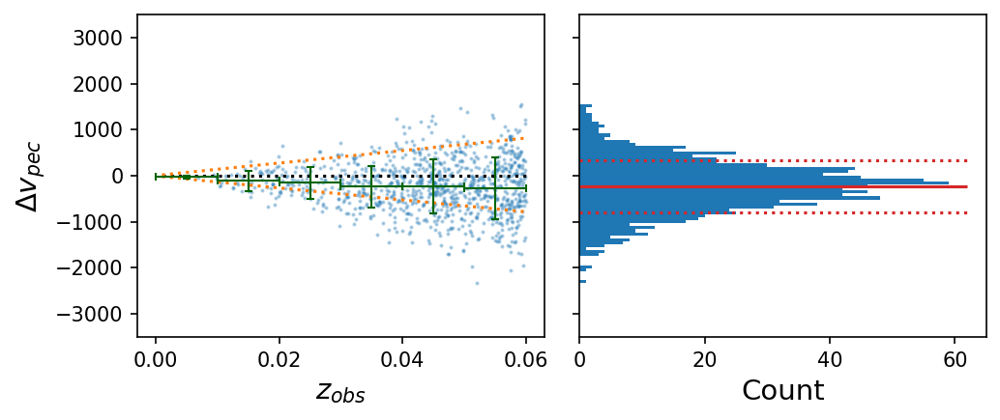

In [19]:
fig, (ax3, ax4) = plt.subplots(
    ncols=2, sharey="row", figsize=(7, 3), dpi=150
)
delta_pv = (
    data_tot[data_tot.ztf_vpec].z_cosmo - data_tot[data_tot.ztf_vpec].calc_z_cosmo
) * c*1e-3

ax3.scatter(
    data_tot[data_tot.ztf_vpec].z,
    delta_pv,
    s=1,
    alpha=0.3,
    color="tab:blue",
)
ax3.plot(np.linspace(1e-3, 0.06, 1000), np.zeros(1000), ":k")
ax3.set_xlabel(r"$z_{obs}$")
ax3.set_ylabel(r"$\Delta v_{pec}$")
ax3.set_ylim(-3500,3500)

ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_up), linestyle=":", color="tab:orange",
         label=r'Effet de $\sigma_{int}$ à $1\sigma$' + '\n' +'$\sigma_{v, int}=$' + \
         f'{(np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_up)) - np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_do)))/2:.1f} km/s')
ax3.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_do), linestyle=":", color="tab:orange")

ax3.errorbar(np.linspace(0.00, 0.05, 6)+0.005,
             [delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].mean() for z_min in np.linspace(0.00, 0.05, 6)],
             yerr=[delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].std() for z_min in np.linspace(0.00, 0.05, 6)],
             xerr=0.005,
             linestyle='',
             color='darkgreen',
             linewidth=1,
             capsize=2)

ax4.hist(delta_pv, bins=60, orientation="horizontal", color="tab:blue")
m = ax4.get_xlim()[1]
ax4.hlines(
    [delta_pv.mean() - delta_pv.std(), delta_pv.mean() + delta_pv.std()],
    xmin=0,
    xmax=m,
    color="tab:red",
    linestyle=":",
    label=r"Dispersion à 1$\sigma$"+"\n"+r"$\sigma_{v_{pec}} =$" + f" {delta_pv.std():.1f} km/s",
)
ax4.hlines(
    delta_pv.mean(),
    xmin=0,
    xmax=m,
    color="tab:red",
    label="Moyenne des erreurs\n"+r"$\overline{\Delta v_{pec}} =$" + f" {delta_pv.mean():.1f} km/s",
)

ax4.set_xlabel(r"Count")

# fig.legend(loc=1, bbox_to_anchor=(0.425, 0.5, 0.5, 0.45), reverse=True)
plt.tight_layout()
plt.savefig('../figures/Rapports/vp_nacl_clean')

In [20]:
popt_dv, pcov_dv = curve_fit(aff,
                             data_tot[data_tot.ztf_vpec].z, delta_pv,)


In [21]:
popt_dv

array([-3354.55680874,   -83.01348359])

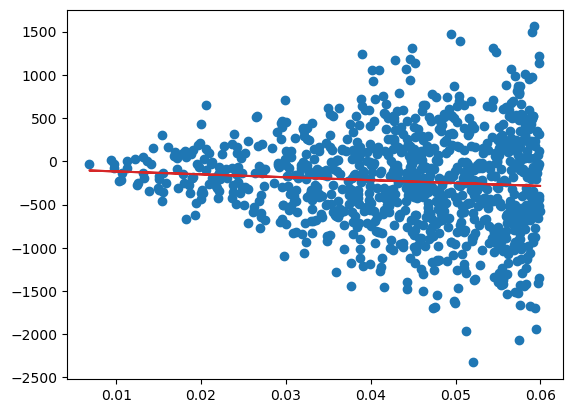

In [22]:
plt.scatter(data_tot[data_tot.ztf_vpec].z, delta_pv)
plt.plot(data_tot[data_tot.ztf_vpec].z, aff(data_tot[data_tot.ztf_vpec].z, *popt_dv), "tab:red")

In [23]:
delta_pv -= aff(data_tot[data_tot.ztf_vpec].z, *popt_dv)

<ErrorbarContainer object of 3 artists>

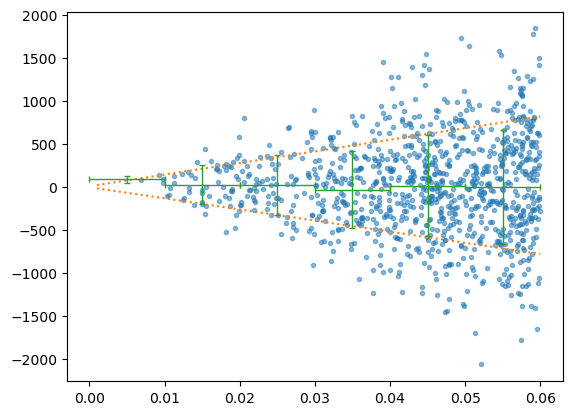

In [24]:
plt.scatter(data_tot[data_tot.ztf_vpec].z, delta_pv, marker='.', alpha=.5)

plt.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_up), linestyle=":", color="tab:orange",
         label=r'Effet de $\sigma_{int}$ à $1\sigma$' + '\n' +'$\sigma_{v, int}=$' + \
         f'{(np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_up)) - np.mean(aff(data_tot[data_tot.ztf_vpec]["z"], *popt_do)))/2:.1f} km/s')
plt.plot(np.linspace(0.001, 0.06), aff(np.linspace(0.001, 0.06), *popt_do), linestyle=":", color="tab:orange")
plt.errorbar(np.linspace(0.00, 0.05, 6)+0.005,
             [delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].mean() for z_min in np.linspace(0.00, 0.05, 6)],
             yerr=[delta_pv[(data_tot['z'] > z_min) & (data_tot['z'] < z_min + 0.01)].std() for z_min in np.linspace(0.00, 0.05, 6)],
             xerr=0.005,
             linestyle='',
             color='tab:green',
             linewidth=1,
             capsize=2)


In [25]:
popt_dv*.06

array([-201.27340852,   -4.98080902])

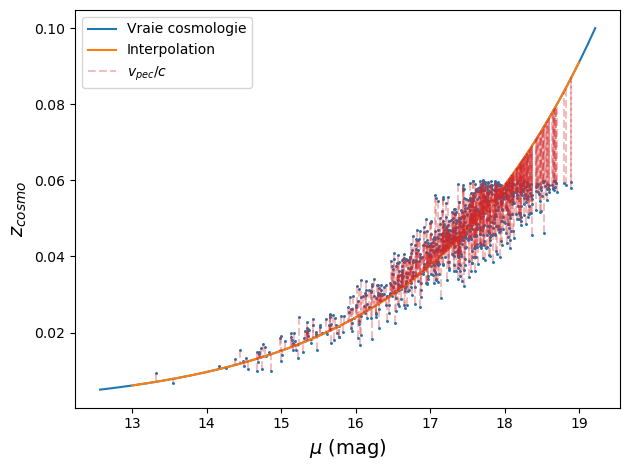

In [26]:
plt.plot(cosmo(res, {"z": jnp.linspace(5e-3, 0.1, 10000)}), np.linspace(5e-3, 0.1,10000), label="Vraie cosmologie")
plt.plot(np.linspace(13, 19, 100000), mag_to_z_cosmo(np.linspace(13, 19, 100000)), label="Interpolation")
plt.scatter(data_tot[data_tot.ztf_vpec].Mb + res['coef'][0] * data_tot[data_tot.ztf_vpec].x1 - res["coef"][1] * data_tot[data_tot.ztf_vpec].c,
            data_tot[data_tot.ztf_vpec].z, marker=".", s=5)
plt.vlines(data_tot[data_tot.ztf_vpec].Mb + res['coef'][0] * data_tot[data_tot.ztf_vpec].x1 - res["coef"][1] * data_tot[data_tot.ztf_vpec].c,
           data_tot[data_tot.ztf_vpec].z,
           mag_to_z_cosmo(data_tot[data_tot.ztf_vpec].Mb + res['coef'][0] * data_tot[data_tot.ztf_vpec].x1 - res["coef"][1] * data_tot[data_tot.ztf_vpec].c),
           linestyle="--",
           alpha=0.3,
           color="tab:red",
           label='$v_{pec}/c$')

plt.xlabel("$\mu$ (mag)")
plt.ylabel("$z_{cosmo}$")
plt.legend()
plt.tight_layout()
plt.savefig("../figures/Rapports/z_mu.png")